# Manga DCGAN

This notebook is an expriment of using DC-GAN (Deep Convolutional Generative Adverserial Network) to generate comic/manga characters.

In [1]:
%matplotlib inline

import pickle as pkl

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from glob import glob
from PIL import Image

import os
import datetime

In [2]:
!mkdir checkpoints

A subdirectory or file checkpoints already exists.


## Network Input

In [3]:
def model_inputs(real_dim, z_dim):
    input_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    return input_real, input_z

## Data Processing

In [4]:
def get_image(image_path, width, height, mode):
    """
    Read image from image_path
    :param image_path: Path of image
    :param width: Width of image
    :param height: Height of image
    :param mode: Mode of image
    :return: Image data
    """
    image = Image.open(image_path)
    
    if image.size != (width, height):
        # Resize image
        image = image.resize((width, height))
    
    return np.array(image.convert(mode))


def get_batch(image_files, width, height, mode):
    data_batch = np.array(
        [get_image(file, width, height, mode) for file in image_files]).astype(np.float32)
    
    # Make sure the images are in 4 dimensions
    if len(data_batch.shape) < 4:
        data_batch = data_batch.reshape(data_batch.shape + (1,))
        
    return data_batch

def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [5]:
class Dataset:
    def __init__(self, data_files, image_width=96, image_height=96, scale_func=None):
        """
        Initialize the class
        :param data_files: List of files in the database
        :param
        :param
        :param scale_func: Scale function
        """
        image_channels = 3
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
            
        self.image_mode = 'RGB'
        self.data_files = data_files
        self.shape = len(data_files), image_width, image_height, image_channels
        
    def get_batches(self, batch_size):
        """
        Generate batches
        :param batch_size: Batch size
        :return Batches of data
        """
        current_index = 0
        while current_index + batch_size <= self.shape[0]:
            data_batch = get_batch(
                self.data_files[current_index:current_index + batch_size],
                *self.shape[1:3],
                self.image_mode)

            current_index += batch_size
            
            yield self.scaler(data_batch)

## Generator

In [6]:
def generator(z, image_dim, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        
        # First fully connected layer
        layer1 = tf.layers.dense(z, image_dim*image_dim*1024)
        layer1 = tf.reshape(layer1, (-1, image_dim, image_dim, 1024))
        layer1 = tf.layers.batch_normalization(layer1, training=training)
        layer1 = tf.maximum(alpha * layer1, layer1) # Leaky ReLU
        
        # First conv layer
        layer2 = tf.layers.conv2d_transpose(layer1, 512, 5, strides=2, padding='same')
        layer2 = tf.layers.batch_normalization(layer2, training=training)
        layer2 = tf.maximum(alpha * layer2, layer2) # Leaky ReLU
        
        # Second conv layer
        layer3 = tf.layers.conv2d_transpose(layer2, 256, 5, strides=2, padding='same')
        layer3 = tf.layers.batch_normalization(layer3, training=training)
        layer3 = tf.maximum(alpha * layer3, layer3) # Leaky ReLU
        
        # Third conv layer
        layer4 = tf.layers.conv2d_transpose(layer3, 128, 5, strides=2, padding='same')
        layer4 = tf.layers.batch_normalization(layer4, training=training)
        layer4 = tf.maximum(alpha * layer4, layer4) # Leaky ReLU
        
        # Output layer, image_dimximage_dimx3
        logits = tf.layers.conv2d_transpose(layer4, output_dim, 5, strides=2, padding='same')
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

In [7]:
def discriminator(x, image_dim, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # Input is 96x96x3
        layer1 = tf.layers.conv2d(x, 128, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * layer1, layer1)

        # 48x48x128
        layer2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(layer2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)

        # 24x24x256
        layer3 = tf.layers.conv2d_transpose(relu2, 512, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(layer3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)

        # 12x12x512
        layer4 = tf.layers.conv2d_transpose(relu3, 1024, 5, strides=2, padding='same')
        bn4 = tf.layers.batch_normalization(layer4, training=True)
        relu4 = tf.maximum(alpha * bn4, bn4)

        # 6x6x1024
        flat = tf.reshape(relu4, (-1, image_dim*image_dim*1024))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

        return out, logits

## Model Loss

In [8]:
def model_loss(input_real, image_dim, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, image_dim, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, image_dim, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, image_dim, reuse=True, alpha=alpha)
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss

## Optimizers

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    # Optimize, Using Adam optimizer
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

In [10]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, image_size, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        # Image size
        self.image_size = image_size
        
        # Create input place holders
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        # Get the model losses
        self.d_loss, self.g_loss = model_loss(self.input_real, self.image_size, self.input_z, real_size[2], alpha=alpha)
        
        # Get the optimized parameters
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1=beta1)      

In [11]:
# Helper method to visualize the generated outout
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
    
    # No gap between subplots
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

In [12]:
def train(model, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver() # Saver used to save the checkpoints
    samples, losses = [], [] # Outputs
    
    sample_z = np.random.uniform(-1, 1, size=(9, z_size)) # Generate 9 images
    
    steps = 0 # This variable is for showing the generator images
    
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    with tf.Session(config=config) as sess:
        # Initialize the variables, this is a 
        # standard tensorflow operation
        sess.run(tf.global_variables_initializer())
        
        # Loop through epochs...
        for e in range(epochs):
            for x in dataset.get_batches(batch_size):
                steps += 1
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))
                
                # Run optimizers
                _ = sess.run(model.d_opt, feed_dict={model.input_real: x, model.input_z: batch_z})
                _ = sess.run(model.g_opt, feed_dict={model.input_z: batch_z, model.input_real: x})
                
                # Display options
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = model.d_loss.eval({model.input_z:batch_z, model.input_real:x})
                    train_loss_g = model.g_loss.eval({model.input_z:batch_z})
                    now_time = datetime.datetime.now()

                    print(now_time.strftime("%Y-%m-%d %H:%M:%S"),
                          "Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    # Save losses for later view
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % show_every == 0:
                    comic_gen = sess.run(
                                    generator(model.input_z, model.image_size, 3, reuse=True, training=False),
                                    feed_dict={model.input_z: sample_z})
                    # Display generated samples
                    samples.append(comic_gen)
                    _ = view_samples(-1, samples, 3, 3, figsize=figsize)
                    plt.show()
                    
            saver.save(sess, './checkpoints/' + 'generator_' + 'epoch_{}'.format(e+1)+ '.ckpt')  
   
    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
        
    return losses, samples

## Hyperparameters

In [13]:
image_dim = 64
image_size = int(image_dim / 16)
real_size = (image_dim, image_dim, 3)
z_size = 100
learning_rate = 0.0002
batch_size = 25
epochs = 100
alpha = 0.2
beta1 = 0.5

# Create the network
model = GAN(real_size, z_size, learning_rate, image_size, alpha=alpha, beta1=beta1)

## Execution

2018-04-24 12:29:43 Epoch 1/100... Discriminator Loss: 0.2370... Generator Loss: 2.2613
2018-04-24 12:32:17 Epoch 1/100... Discriminator Loss: 1.0738... Generator Loss: 2.1431
2018-04-24 12:34:51 Epoch 1/100... Discriminator Loss: 1.6702... Generator Loss: 2.4522
2018-04-24 12:37:25 Epoch 1/100... Discriminator Loss: 1.1841... Generator Loss: 0.5751
2018-04-24 12:40:00 Epoch 1/100... Discriminator Loss: 1.0149... Generator Loss: 2.1482
2018-04-24 12:42:34 Epoch 1/100... Discriminator Loss: 0.9057... Generator Loss: 1.1295
2018-04-24 12:45:08 Epoch 1/100... Discriminator Loss: 0.8926... Generator Loss: 1.2624
2018-04-24 12:47:43 Epoch 1/100... Discriminator Loss: 1.0213... Generator Loss: 1.5234
2018-04-24 12:50:19 Epoch 1/100... Discriminator Loss: 0.9384... Generator Loss: 1.1398
2018-04-24 12:52:54 Epoch 1/100... Discriminator Loss: 0.8717... Generator Loss: 1.6215


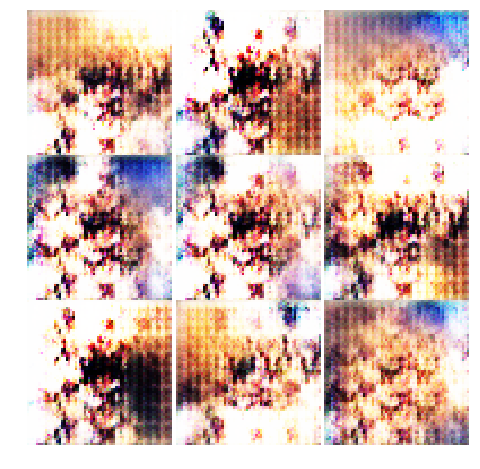

2018-04-24 12:55:30 Epoch 1/100... Discriminator Loss: 0.7171... Generator Loss: 1.4086
2018-04-24 12:58:06 Epoch 1/100... Discriminator Loss: 0.8603... Generator Loss: 0.9939
2018-04-24 13:00:42 Epoch 1/100... Discriminator Loss: 0.8310... Generator Loss: 0.8209
2018-04-24 13:03:17 Epoch 1/100... Discriminator Loss: 1.1565... Generator Loss: 0.6533
2018-04-24 13:05:54 Epoch 1/100... Discriminator Loss: 0.9926... Generator Loss: 0.7612
2018-04-24 13:08:30 Epoch 1/100... Discriminator Loss: 0.9555... Generator Loss: 1.7207
2018-04-24 13:11:09 Epoch 1/100... Discriminator Loss: 1.0594... Generator Loss: 1.5042
2018-04-24 13:13:45 Epoch 1/100... Discriminator Loss: 1.2953... Generator Loss: 0.4548
2018-04-24 13:16:21 Epoch 1/100... Discriminator Loss: 1.6736... Generator Loss: 3.8575
2018-04-24 13:18:56 Epoch 1/100... Discriminator Loss: 0.8463... Generator Loss: 1.2819


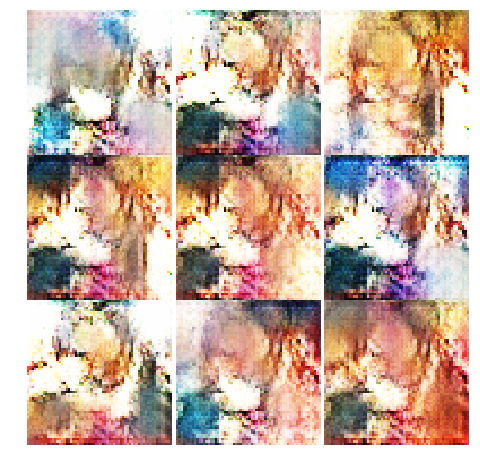

2018-04-24 13:21:32 Epoch 1/100... Discriminator Loss: 1.0392... Generator Loss: 1.7498
2018-04-24 13:24:08 Epoch 1/100... Discriminator Loss: 0.8936... Generator Loss: 2.9879
2018-04-24 13:26:43 Epoch 1/100... Discriminator Loss: 0.8278... Generator Loss: 1.0965
2018-04-24 13:29:19 Epoch 1/100... Discriminator Loss: 0.8356... Generator Loss: 1.1184
2018-04-24 13:31:54 Epoch 1/100... Discriminator Loss: 0.8099... Generator Loss: 1.1107
2018-04-24 13:34:29 Epoch 1/100... Discriminator Loss: 1.3508... Generator Loss: 1.9622
2018-04-24 13:37:05 Epoch 1/100... Discriminator Loss: 0.8386... Generator Loss: 1.2245
2018-04-24 13:39:41 Epoch 1/100... Discriminator Loss: 0.9415... Generator Loss: 0.9245
2018-04-24 13:42:17 Epoch 1/100... Discriminator Loss: 0.9033... Generator Loss: 3.0771
2018-04-24 13:44:54 Epoch 1/100... Discriminator Loss: 0.8630... Generator Loss: 1.0151


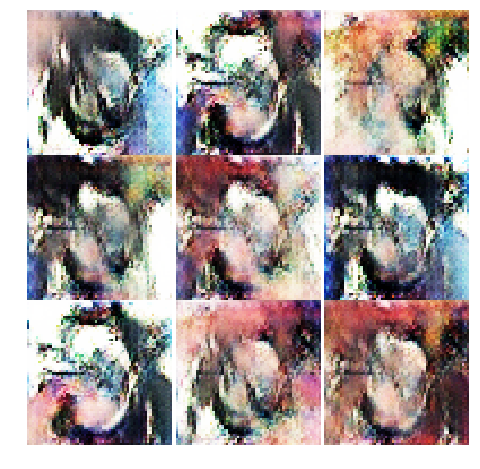

2018-04-24 13:47:30 Epoch 1/100... Discriminator Loss: 0.6399... Generator Loss: 1.6732
2018-04-24 13:50:09 Epoch 2/100... Discriminator Loss: 1.4675... Generator Loss: 0.4726
2018-04-24 13:52:44 Epoch 2/100... Discriminator Loss: 0.7434... Generator Loss: 1.0462
2018-04-24 13:55:18 Epoch 2/100... Discriminator Loss: 0.9834... Generator Loss: 1.1388
2018-04-24 13:57:52 Epoch 2/100... Discriminator Loss: 0.6009... Generator Loss: 1.2895
2018-04-24 14:00:26 Epoch 2/100... Discriminator Loss: 0.5664... Generator Loss: 1.7093
2018-04-24 14:03:00 Epoch 2/100... Discriminator Loss: 0.7714... Generator Loss: 0.9812
2018-04-24 14:05:33 Epoch 2/100... Discriminator Loss: 0.6507... Generator Loss: 1.1152
2018-04-24 14:08:07 Epoch 2/100... Discriminator Loss: 0.5769... Generator Loss: 2.4268
2018-04-24 14:10:40 Epoch 2/100... Discriminator Loss: 0.6791... Generator Loss: 1.7523


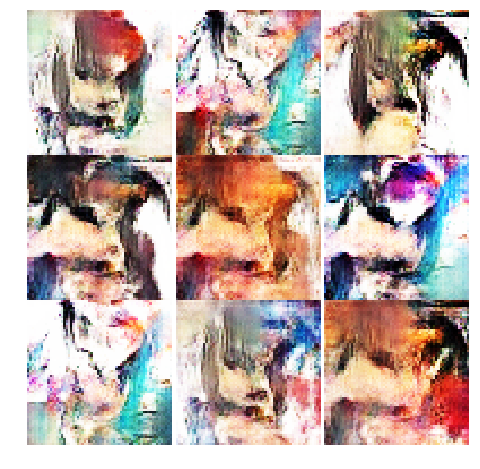

2018-04-24 14:13:14 Epoch 2/100... Discriminator Loss: 0.6049... Generator Loss: 1.3528
2018-04-24 14:15:47 Epoch 2/100... Discriminator Loss: 0.3610... Generator Loss: 2.1509
2018-04-24 14:18:21 Epoch 2/100... Discriminator Loss: 0.5411... Generator Loss: 1.4541
2018-04-24 14:20:54 Epoch 2/100... Discriminator Loss: 0.6595... Generator Loss: 2.8159
2018-04-24 14:23:28 Epoch 2/100... Discriminator Loss: 0.9332... Generator Loss: 1.0194
2018-04-24 14:26:02 Epoch 2/100... Discriminator Loss: 1.0190... Generator Loss: 2.9791
2018-04-24 14:28:35 Epoch 2/100... Discriminator Loss: 0.4883... Generator Loss: 2.1912
2018-04-24 14:31:09 Epoch 2/100... Discriminator Loss: 0.4519... Generator Loss: 1.6963
2018-04-24 14:33:43 Epoch 2/100... Discriminator Loss: 2.2483... Generator Loss: 4.6960
2018-04-24 14:36:17 Epoch 2/100... Discriminator Loss: 1.2136... Generator Loss: 3.6898


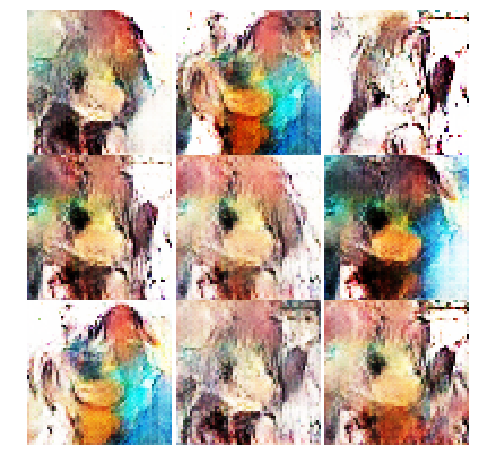

2018-04-24 14:38:52 Epoch 2/100... Discriminator Loss: 1.2806... Generator Loss: 0.8343
2018-04-24 14:41:27 Epoch 2/100... Discriminator Loss: 0.9999... Generator Loss: 3.2381
2018-04-24 14:44:01 Epoch 2/100... Discriminator Loss: 0.7461... Generator Loss: 2.3190
2018-04-24 14:46:35 Epoch 2/100... Discriminator Loss: 0.4884... Generator Loss: 1.3687
2018-04-24 14:49:09 Epoch 2/100... Discriminator Loss: 0.6498... Generator Loss: 1.2501
2018-04-24 14:51:43 Epoch 2/100... Discriminator Loss: 0.5032... Generator Loss: 2.1915
2018-04-24 14:54:17 Epoch 2/100... Discriminator Loss: 0.3342... Generator Loss: 1.8343
2018-04-24 14:56:50 Epoch 2/100... Discriminator Loss: 0.3128... Generator Loss: 1.8685
2018-04-24 14:59:24 Epoch 2/100... Discriminator Loss: 0.3625... Generator Loss: 2.2569
2018-04-24 15:01:57 Epoch 2/100... Discriminator Loss: 0.5354... Generator Loss: 2.2616


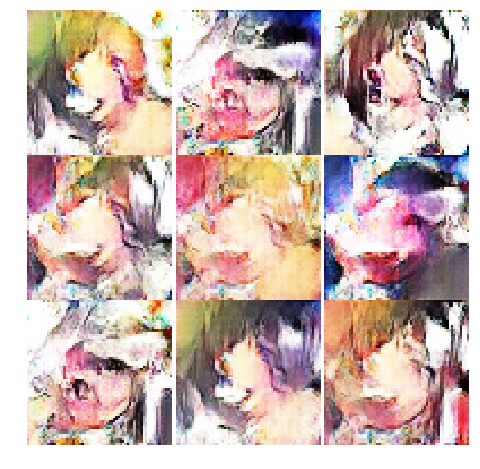

2018-04-24 15:04:31 Epoch 2/100... Discriminator Loss: 2.3087... Generator Loss: 0.2021
2018-04-24 15:07:04 Epoch 2/100... Discriminator Loss: 0.5440... Generator Loss: 2.8524
2018-04-24 15:09:38 Epoch 2/100... Discriminator Loss: 0.4940... Generator Loss: 1.7705
2018-04-24 15:12:16 Epoch 3/100... Discriminator Loss: 0.4102... Generator Loss: 1.8619
2018-04-24 15:14:49 Epoch 3/100... Discriminator Loss: 0.8798... Generator Loss: 0.8627
2018-04-24 15:17:23 Epoch 3/100... Discriminator Loss: 0.7154... Generator Loss: 1.0498
2018-04-24 15:19:57 Epoch 3/100... Discriminator Loss: 1.2636... Generator Loss: 0.5089
2018-04-24 15:22:31 Epoch 3/100... Discriminator Loss: 0.4935... Generator Loss: 3.4508
2018-04-24 15:25:05 Epoch 3/100... Discriminator Loss: 0.3509... Generator Loss: 2.4470
2018-04-24 15:27:40 Epoch 3/100... Discriminator Loss: 0.3801... Generator Loss: 2.9420


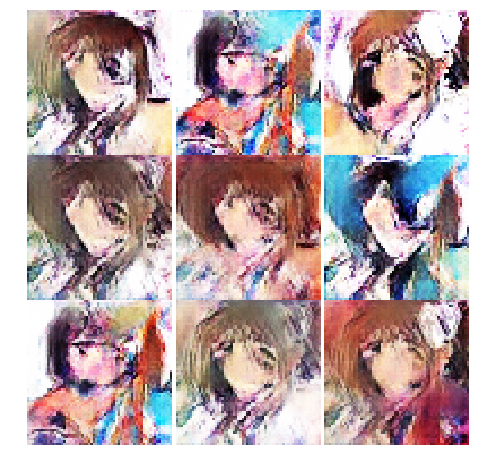

2018-04-24 15:30:15 Epoch 3/100... Discriminator Loss: 0.3065... Generator Loss: 2.3210
2018-04-24 15:32:49 Epoch 3/100... Discriminator Loss: 0.8658... Generator Loss: 0.9481
2018-04-24 15:35:24 Epoch 3/100... Discriminator Loss: 1.0130... Generator Loss: 0.8306
2018-04-24 15:37:57 Epoch 3/100... Discriminator Loss: 0.3468... Generator Loss: 3.0824
2018-04-24 15:40:31 Epoch 3/100... Discriminator Loss: 1.3225... Generator Loss: 6.2031
2018-04-24 15:43:05 Epoch 3/100... Discriminator Loss: 1.7033... Generator Loss: 1.0465
2018-04-24 15:45:39 Epoch 3/100... Discriminator Loss: 1.5773... Generator Loss: 0.4200
2018-04-24 15:48:12 Epoch 3/100... Discriminator Loss: 0.2106... Generator Loss: 2.8544
2018-04-24 15:50:45 Epoch 3/100... Discriminator Loss: 1.2616... Generator Loss: 4.6757
2018-04-24 15:53:19 Epoch 3/100... Discriminator Loss: 0.1948... Generator Loss: 3.4791


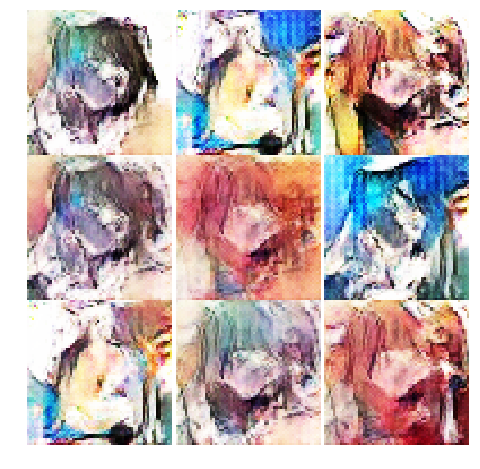

2018-04-24 15:55:53 Epoch 3/100... Discriminator Loss: 0.5517... Generator Loss: 1.1962
2018-04-24 15:58:26 Epoch 3/100... Discriminator Loss: 0.3663... Generator Loss: 1.8595
2018-04-24 16:01:00 Epoch 3/100... Discriminator Loss: 0.7733... Generator Loss: 1.1334
2018-04-24 16:03:34 Epoch 3/100... Discriminator Loss: 2.7740... Generator Loss: 8.0645
2018-04-24 16:06:08 Epoch 3/100... Discriminator Loss: 0.5230... Generator Loss: 1.4491
2018-04-24 16:08:42 Epoch 3/100... Discriminator Loss: 0.2350... Generator Loss: 3.1543
2018-04-24 16:11:16 Epoch 3/100... Discriminator Loss: 0.2948... Generator Loss: 2.2604
2018-04-24 16:13:50 Epoch 3/100... Discriminator Loss: 0.1849... Generator Loss: 2.6011
2018-04-24 16:16:25 Epoch 3/100... Discriminator Loss: 0.1720... Generator Loss: 2.7911
2018-04-24 16:18:59 Epoch 3/100... Discriminator Loss: 0.3849... Generator Loss: 1.7760


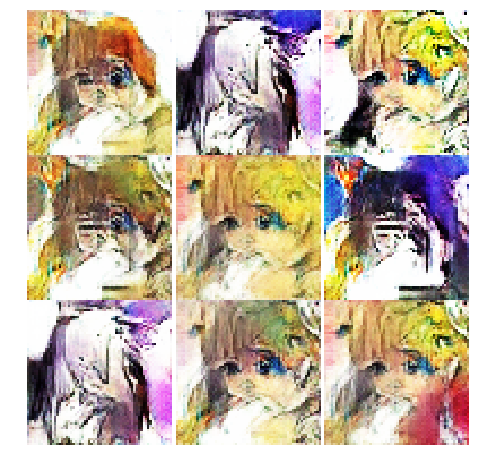

2018-04-24 16:21:34 Epoch 3/100... Discriminator Loss: 0.3659... Generator Loss: 3.6555
2018-04-24 16:24:08 Epoch 3/100... Discriminator Loss: 0.5160... Generator Loss: 1.3769
2018-04-24 16:26:42 Epoch 3/100... Discriminator Loss: 0.3344... Generator Loss: 2.3329
2018-04-24 16:29:16 Epoch 3/100... Discriminator Loss: 0.7642... Generator Loss: 4.6308
2018-04-24 16:31:53 Epoch 4/100... Discriminator Loss: 0.4966... Generator Loss: 2.0057
2018-04-24 16:34:27 Epoch 4/100... Discriminator Loss: 0.2984... Generator Loss: 2.4030
2018-04-24 16:37:01 Epoch 4/100... Discriminator Loss: 0.4922... Generator Loss: 1.9954
2018-04-24 16:39:35 Epoch 4/100... Discriminator Loss: 0.4135... Generator Loss: 2.4055
2018-04-24 16:42:08 Epoch 4/100... Discriminator Loss: 0.2514... Generator Loss: 3.0329
2018-04-24 16:44:42 Epoch 4/100... Discriminator Loss: 0.1656... Generator Loss: 2.9014


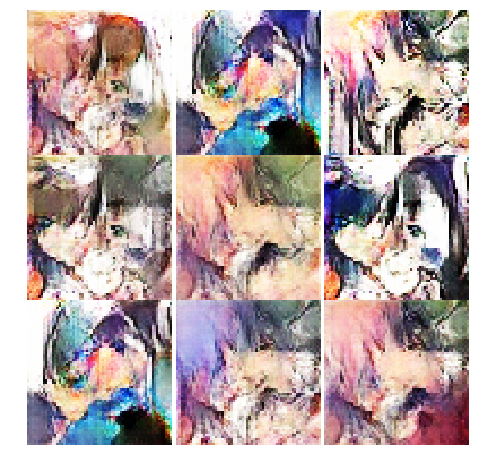

2018-04-24 16:47:16 Epoch 4/100... Discriminator Loss: 0.3394... Generator Loss: 2.2182
2018-04-24 16:49:49 Epoch 4/100... Discriminator Loss: 0.2876... Generator Loss: 2.0146
2018-04-24 16:52:23 Epoch 4/100... Discriminator Loss: 1.6282... Generator Loss: 0.4047
2018-04-24 16:54:57 Epoch 4/100... Discriminator Loss: 0.2986... Generator Loss: 2.2523
2018-04-24 16:57:31 Epoch 4/100... Discriminator Loss: 0.1899... Generator Loss: 3.1376
2018-04-24 17:00:05 Epoch 4/100... Discriminator Loss: 0.1956... Generator Loss: 2.8970
2018-04-24 17:02:39 Epoch 4/100... Discriminator Loss: 0.3352... Generator Loss: 1.9404
2018-04-24 17:05:14 Epoch 4/100... Discriminator Loss: 0.1894... Generator Loss: 2.6184
2018-04-24 17:07:48 Epoch 4/100... Discriminator Loss: 0.3795... Generator Loss: 2.1599
2018-04-24 17:10:22 Epoch 4/100... Discriminator Loss: 0.3556... Generator Loss: 1.8100


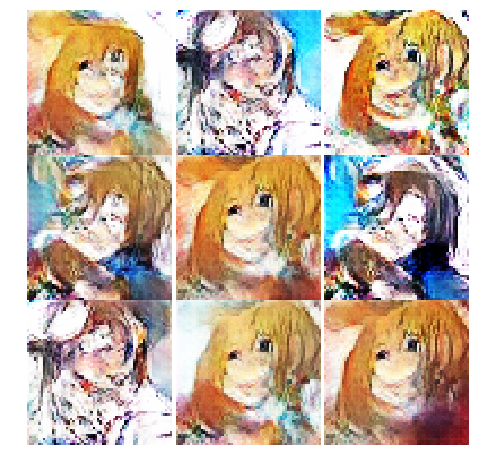

2018-04-24 17:12:57 Epoch 4/100... Discriminator Loss: 0.5498... Generator Loss: 3.5977
2018-04-24 17:15:30 Epoch 4/100... Discriminator Loss: 0.2401... Generator Loss: 3.7299
2018-04-24 17:18:04 Epoch 4/100... Discriminator Loss: 0.2856... Generator Loss: 3.7147
2018-04-24 17:20:38 Epoch 4/100... Discriminator Loss: 0.4243... Generator Loss: 2.1112
2018-04-24 17:23:11 Epoch 4/100... Discriminator Loss: 0.4203... Generator Loss: 4.2037
2018-04-24 17:25:45 Epoch 4/100... Discriminator Loss: 0.5664... Generator Loss: 1.9597
2018-04-24 17:28:18 Epoch 4/100... Discriminator Loss: 0.3550... Generator Loss: 2.0841
2018-04-24 17:30:52 Epoch 4/100... Discriminator Loss: 0.3048... Generator Loss: 3.1645
2018-04-24 17:33:25 Epoch 4/100... Discriminator Loss: 0.0846... Generator Loss: 5.7126
2018-04-24 17:35:58 Epoch 4/100... Discriminator Loss: 1.7075... Generator Loss: 0.5461


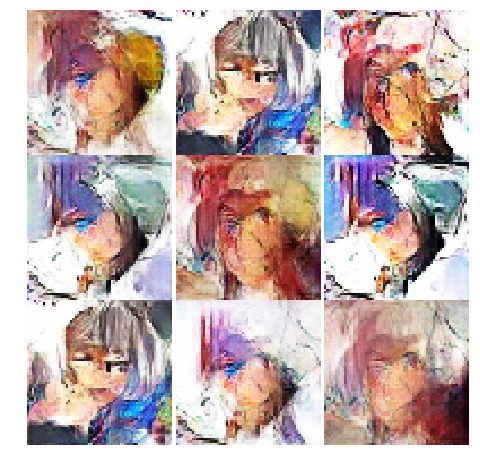

2018-04-24 17:38:32 Epoch 4/100... Discriminator Loss: 0.3008... Generator Loss: 3.3257
2018-04-24 17:41:06 Epoch 4/100... Discriminator Loss: 0.3789... Generator Loss: 1.6533
2018-04-24 17:43:40 Epoch 4/100... Discriminator Loss: 0.3488... Generator Loss: 2.1317
2018-04-24 17:46:14 Epoch 4/100... Discriminator Loss: 0.5875... Generator Loss: 1.4992
2018-04-24 17:48:48 Epoch 4/100... Discriminator Loss: 0.5842... Generator Loss: 1.4109
2018-04-24 17:51:22 Epoch 4/100... Discriminator Loss: 0.2252... Generator Loss: 3.0705
2018-04-24 17:53:59 Epoch 5/100... Discriminator Loss: 0.7684... Generator Loss: 0.9340
2018-04-24 17:56:34 Epoch 5/100... Discriminator Loss: 0.5889... Generator Loss: 1.2905
2018-04-24 17:59:08 Epoch 5/100... Discriminator Loss: 0.1731... Generator Loss: 2.8241
2018-04-24 18:01:41 Epoch 5/100... Discriminator Loss: 0.2818... Generator Loss: 1.9885


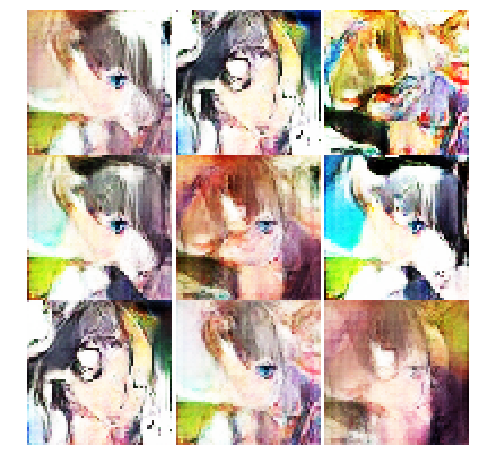

2018-04-24 18:04:16 Epoch 5/100... Discriminator Loss: 0.1481... Generator Loss: 3.5971
2018-04-24 18:06:49 Epoch 5/100... Discriminator Loss: 0.2047... Generator Loss: 2.6360
2018-04-24 18:09:22 Epoch 5/100... Discriminator Loss: 1.5795... Generator Loss: 6.8203
2018-04-24 18:11:56 Epoch 5/100... Discriminator Loss: 0.3235... Generator Loss: 3.8856
2018-04-24 18:14:29 Epoch 5/100... Discriminator Loss: 0.0509... Generator Loss: 4.1351
2018-04-24 18:17:03 Epoch 5/100... Discriminator Loss: 0.5221... Generator Loss: 4.8077
2018-04-24 18:19:36 Epoch 5/100... Discriminator Loss: 0.2155... Generator Loss: 2.7031
2018-04-24 18:22:09 Epoch 5/100... Discriminator Loss: 0.6904... Generator Loss: 1.2584
2018-04-24 18:24:43 Epoch 5/100... Discriminator Loss: 0.9079... Generator Loss: 0.9503
2018-04-24 18:27:16 Epoch 5/100... Discriminator Loss: 0.3253... Generator Loss: 5.0680


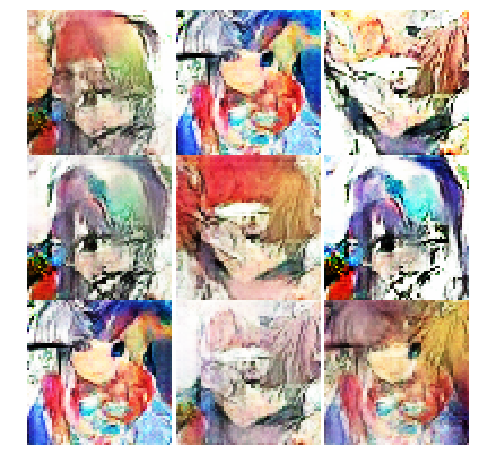

2018-04-24 18:29:50 Epoch 5/100... Discriminator Loss: 0.5082... Generator Loss: 1.5256
2018-04-24 18:32:24 Epoch 5/100... Discriminator Loss: 0.2772... Generator Loss: 2.1443
2018-04-24 18:34:58 Epoch 5/100... Discriminator Loss: 0.3058... Generator Loss: 2.0683
2018-04-24 18:37:32 Epoch 5/100... Discriminator Loss: 0.3426... Generator Loss: 1.9848
2018-04-24 18:40:07 Epoch 5/100... Discriminator Loss: 0.4883... Generator Loss: 5.6177
2018-04-24 18:42:41 Epoch 5/100... Discriminator Loss: 0.3052... Generator Loss: 4.3148
2018-04-24 18:45:15 Epoch 5/100... Discriminator Loss: 0.1686... Generator Loss: 3.1339
2018-04-24 18:47:49 Epoch 5/100... Discriminator Loss: 1.2865... Generator Loss: 0.8649
2018-04-24 18:50:23 Epoch 5/100... Discriminator Loss: 0.2710... Generator Loss: 4.1709
2018-04-24 18:52:57 Epoch 5/100... Discriminator Loss: 0.1813... Generator Loss: 3.5583


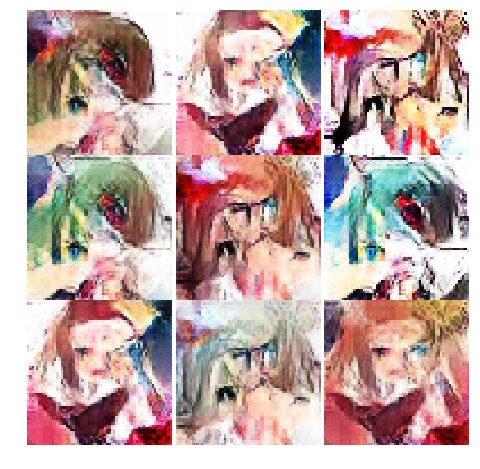

2018-04-24 18:55:30 Epoch 5/100... Discriminator Loss: 0.2828... Generator Loss: 2.0110
2018-04-24 18:58:04 Epoch 5/100... Discriminator Loss: 0.2267... Generator Loss: 2.6026
2018-04-24 19:00:38 Epoch 5/100... Discriminator Loss: 0.2837... Generator Loss: 2.0520
2018-04-24 19:03:11 Epoch 5/100... Discriminator Loss: 0.6218... Generator Loss: 1.2512
2018-04-24 19:05:45 Epoch 5/100... Discriminator Loss: 0.1321... Generator Loss: 3.7774
2018-04-24 19:08:18 Epoch 5/100... Discriminator Loss: 0.2150... Generator Loss: 2.6508
2018-04-24 19:10:52 Epoch 5/100... Discriminator Loss: 0.1600... Generator Loss: 5.6679
2018-04-24 19:13:25 Epoch 5/100... Discriminator Loss: 0.3151... Generator Loss: 1.9151
2018-04-24 19:16:03 Epoch 6/100... Discriminator Loss: 0.8927... Generator Loss: 1.5139
2018-04-24 19:18:36 Epoch 6/100... Discriminator Loss: 0.2344... Generator Loss: 2.7057


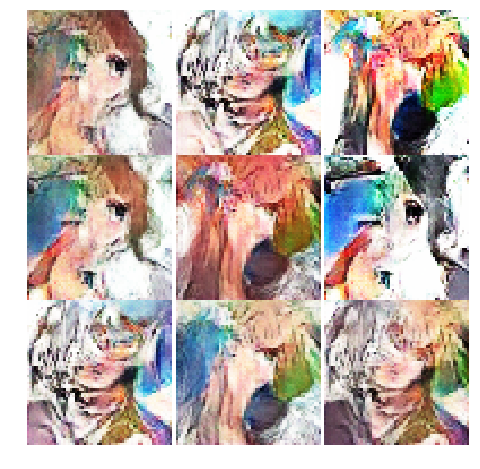

2018-04-24 19:21:11 Epoch 6/100... Discriminator Loss: 0.2520... Generator Loss: 2.3607
2018-04-24 19:23:45 Epoch 6/100... Discriminator Loss: 0.0829... Generator Loss: 3.7073
2018-04-24 19:26:19 Epoch 6/100... Discriminator Loss: 1.1286... Generator Loss: 4.7680
2018-04-24 19:28:54 Epoch 6/100... Discriminator Loss: 0.2151... Generator Loss: 2.5124
2018-04-24 19:31:28 Epoch 6/100... Discriminator Loss: 0.4641... Generator Loss: 1.7009
2018-04-24 19:34:02 Epoch 6/100... Discriminator Loss: 0.7127... Generator Loss: 1.3866
2018-04-24 19:36:37 Epoch 6/100... Discriminator Loss: 0.1505... Generator Loss: 3.0627
2018-04-24 19:39:11 Epoch 6/100... Discriminator Loss: 0.2694... Generator Loss: 2.9936
2018-04-24 19:41:44 Epoch 6/100... Discriminator Loss: 0.1659... Generator Loss: 3.2580
2018-04-24 19:44:18 Epoch 6/100... Discriminator Loss: 1.3347... Generator Loss: 0.5563


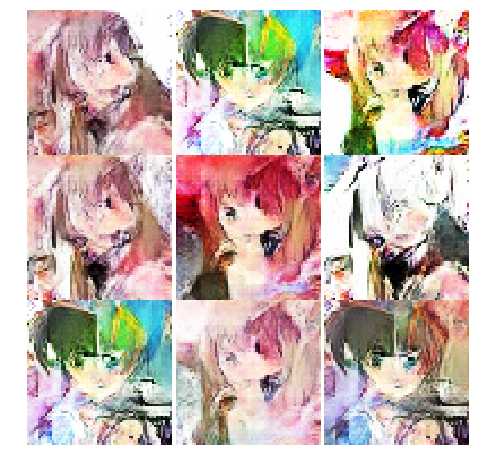

2018-04-24 19:46:52 Epoch 6/100... Discriminator Loss: 0.1718... Generator Loss: 3.4356
2018-04-24 19:49:26 Epoch 6/100... Discriminator Loss: 0.6611... Generator Loss: 1.1620
2018-04-24 19:51:59 Epoch 6/100... Discriminator Loss: 0.1476... Generator Loss: 3.2079
2018-04-24 19:54:32 Epoch 6/100... Discriminator Loss: 0.3477... Generator Loss: 1.9629
2018-04-24 19:57:06 Epoch 6/100... Discriminator Loss: 0.0589... Generator Loss: 4.3845
2018-04-24 19:59:39 Epoch 6/100... Discriminator Loss: 0.9087... Generator Loss: 0.8973
2018-04-24 20:02:13 Epoch 6/100... Discriminator Loss: 0.2039... Generator Loss: 2.6262
2018-04-24 20:04:47 Epoch 6/100... Discriminator Loss: 0.3387... Generator Loss: 1.7705
2018-04-24 20:07:21 Epoch 6/100... Discriminator Loss: 0.2441... Generator Loss: 3.5296
2018-04-24 20:09:55 Epoch 6/100... Discriminator Loss: 0.0453... Generator Loss: 4.7098


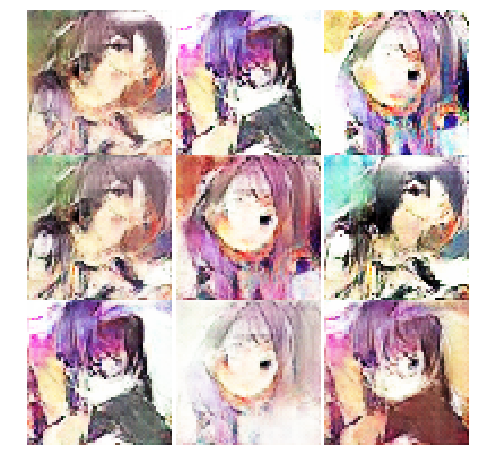

2018-04-24 20:12:29 Epoch 6/100... Discriminator Loss: 1.3294... Generator Loss: 0.6592
2018-04-24 20:15:04 Epoch 6/100... Discriminator Loss: 0.2460... Generator Loss: 2.6260
2018-04-24 20:17:38 Epoch 6/100... Discriminator Loss: 0.2576... Generator Loss: 2.1637
2018-04-24 20:20:13 Epoch 6/100... Discriminator Loss: 0.1649... Generator Loss: 2.8782
2018-04-24 20:22:47 Epoch 6/100... Discriminator Loss: 0.1399... Generator Loss: 5.9511
2018-04-24 20:25:20 Epoch 6/100... Discriminator Loss: 0.1826... Generator Loss: 2.7796
2018-04-24 20:27:54 Epoch 6/100... Discriminator Loss: 0.2119... Generator Loss: 4.4341
2018-04-24 20:30:28 Epoch 6/100... Discriminator Loss: 0.2244... Generator Loss: 3.5491
2018-04-24 20:33:02 Epoch 6/100... Discriminator Loss: 0.4992... Generator Loss: 5.5056
2018-04-24 20:35:40 Epoch 7/100... Discriminator Loss: 0.0673... Generator Loss: 4.0679


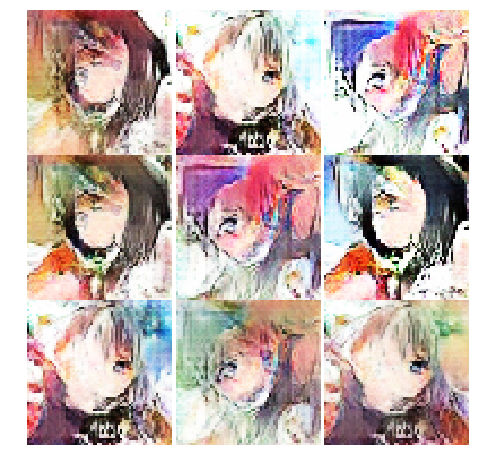

2018-04-24 20:38:14 Epoch 7/100... Discriminator Loss: 0.1668... Generator Loss: 3.1486
2018-04-24 20:40:48 Epoch 7/100... Discriminator Loss: 0.2637... Generator Loss: 4.2854
2018-04-24 20:43:22 Epoch 7/100... Discriminator Loss: 0.8879... Generator Loss: 0.7626
2018-04-24 20:45:55 Epoch 7/100... Discriminator Loss: 0.1501... Generator Loss: 4.2030
2018-04-24 20:48:29 Epoch 7/100... Discriminator Loss: 0.2161... Generator Loss: 5.7579
2018-04-24 20:51:03 Epoch 7/100... Discriminator Loss: 0.1409... Generator Loss: 2.7184
2018-04-24 20:53:37 Epoch 7/100... Discriminator Loss: 0.2589... Generator Loss: 2.2744
2018-04-24 20:56:10 Epoch 7/100... Discriminator Loss: 0.1222... Generator Loss: 4.7032
2018-04-24 20:58:45 Epoch 7/100... Discriminator Loss: 0.2110... Generator Loss: 2.9289
2018-04-24 21:01:19 Epoch 7/100... Discriminator Loss: 0.0992... Generator Loss: 2.9864


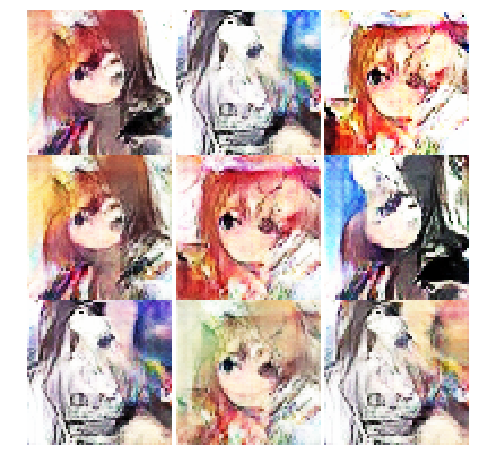

2018-04-24 21:03:54 Epoch 7/100... Discriminator Loss: 0.2550... Generator Loss: 2.9167
2018-04-24 21:06:29 Epoch 7/100... Discriminator Loss: 0.1711... Generator Loss: 3.5188
2018-04-24 21:09:03 Epoch 7/100... Discriminator Loss: 0.1024... Generator Loss: 3.4654
2018-04-24 21:11:37 Epoch 7/100... Discriminator Loss: 0.2662... Generator Loss: 2.5516
2018-04-24 21:14:11 Epoch 7/100... Discriminator Loss: 0.1349... Generator Loss: 3.7556
2018-04-24 21:16:44 Epoch 7/100... Discriminator Loss: 0.1731... Generator Loss: 2.9572
2018-04-24 21:19:18 Epoch 7/100... Discriminator Loss: 0.2364... Generator Loss: 2.2652
2018-04-24 21:21:52 Epoch 7/100... Discriminator Loss: 0.7080... Generator Loss: 1.2430
2018-04-24 21:24:26 Epoch 7/100... Discriminator Loss: 0.3059... Generator Loss: 2.0037
2018-04-24 21:26:59 Epoch 7/100... Discriminator Loss: 0.2102... Generator Loss: 3.1702


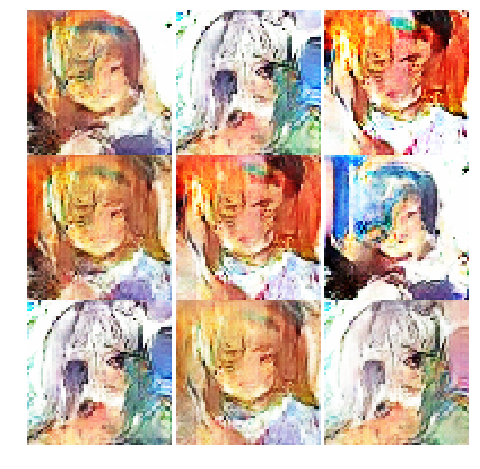

2018-04-24 21:29:33 Epoch 7/100... Discriminator Loss: 0.5292... Generator Loss: 1.2873
2018-04-24 21:32:06 Epoch 7/100... Discriminator Loss: 0.0799... Generator Loss: 5.2022
2018-04-24 21:34:40 Epoch 7/100... Discriminator Loss: 0.1910... Generator Loss: 2.5792
2018-04-24 21:37:14 Epoch 7/100... Discriminator Loss: 0.1141... Generator Loss: 5.1999
2018-04-24 21:39:48 Epoch 7/100... Discriminator Loss: 0.7498... Generator Loss: 1.1695
2018-04-24 21:42:22 Epoch 7/100... Discriminator Loss: 0.3847... Generator Loss: 3.1380
2018-04-24 21:44:56 Epoch 7/100... Discriminator Loss: 0.1888... Generator Loss: 2.6422
2018-04-24 21:47:30 Epoch 7/100... Discriminator Loss: 0.2181... Generator Loss: 2.8250
2018-04-24 21:50:05 Epoch 7/100... Discriminator Loss: 0.1770... Generator Loss: 5.7290
2018-04-24 21:52:39 Epoch 7/100... Discriminator Loss: 0.2654... Generator Loss: 2.3113


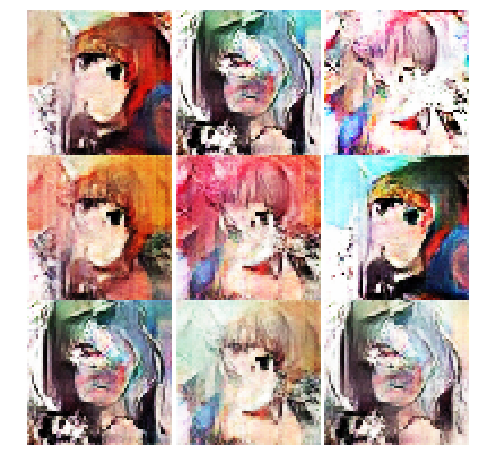

2018-04-24 21:55:14 Epoch 7/100... Discriminator Loss: 0.0258... Generator Loss: 5.1375
2018-04-24 21:57:52 Epoch 8/100... Discriminator Loss: 0.0969... Generator Loss: 3.3984
2018-04-24 22:00:26 Epoch 8/100... Discriminator Loss: 0.0315... Generator Loss: 4.4908
2018-04-24 22:03:00 Epoch 8/100... Discriminator Loss: 0.5181... Generator Loss: 8.5491
2018-04-24 22:05:34 Epoch 8/100... Discriminator Loss: 0.0946... Generator Loss: 3.9576
2018-04-24 22:08:08 Epoch 8/100... Discriminator Loss: 0.1955... Generator Loss: 2.6180
2018-04-24 22:10:41 Epoch 8/100... Discriminator Loss: 0.1789... Generator Loss: 2.8682
2018-04-24 22:13:15 Epoch 8/100... Discriminator Loss: 0.1608... Generator Loss: 2.8807
2018-04-24 22:15:48 Epoch 8/100... Discriminator Loss: 0.2096... Generator Loss: 2.9005
2018-04-24 22:18:22 Epoch 8/100... Discriminator Loss: 0.1853... Generator Loss: 3.9798


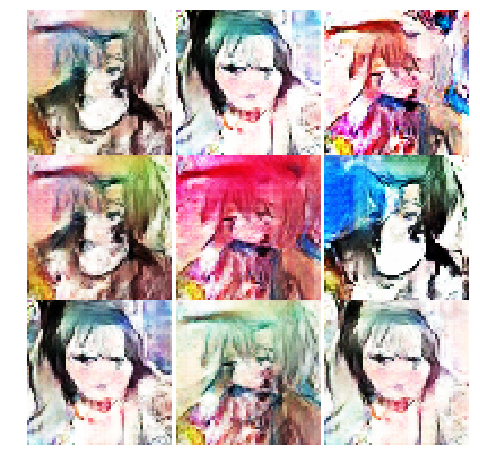

2018-04-24 22:20:56 Epoch 8/100... Discriminator Loss: 0.1422... Generator Loss: 3.2908
2018-04-24 22:23:26 Epoch 8/100... Discriminator Loss: 0.1393... Generator Loss: 3.2698
2018-04-24 22:26:00 Epoch 8/100... Discriminator Loss: 0.2314... Generator Loss: 2.8792
2018-04-24 22:28:34 Epoch 8/100... Discriminator Loss: 0.3821... Generator Loss: 2.0257
2018-04-24 22:31:08 Epoch 8/100... Discriminator Loss: 0.0750... Generator Loss: 5.2068
2018-04-24 22:33:42 Epoch 8/100... Discriminator Loss: 0.1434... Generator Loss: 3.1953
2018-04-24 22:36:16 Epoch 8/100... Discriminator Loss: 0.1665... Generator Loss: 6.1114
2018-04-24 22:38:51 Epoch 8/100... Discriminator Loss: 0.2334... Generator Loss: 7.3362
2018-04-24 22:41:26 Epoch 8/100... Discriminator Loss: 0.0711... Generator Loss: 4.4664
2018-04-24 22:44:00 Epoch 8/100... Discriminator Loss: 0.2541... Generator Loss: 2.4265


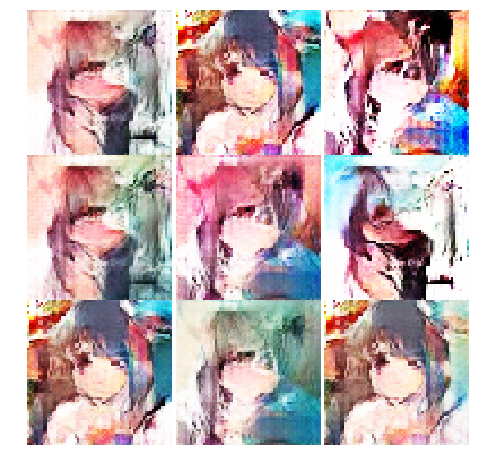

2018-04-24 22:46:35 Epoch 8/100... Discriminator Loss: 0.1327... Generator Loss: 3.1130
2018-04-24 22:49:08 Epoch 8/100... Discriminator Loss: 0.1942... Generator Loss: 2.6175
2018-04-24 22:51:42 Epoch 8/100... Discriminator Loss: 0.2667... Generator Loss: 2.1349
2018-04-24 22:54:16 Epoch 8/100... Discriminator Loss: 0.0734... Generator Loss: 5.0792
2018-04-24 22:56:49 Epoch 8/100... Discriminator Loss: 0.1663... Generator Loss: 3.1077
2018-04-24 22:59:23 Epoch 8/100... Discriminator Loss: 0.0926... Generator Loss: 4.0948
2018-04-24 23:01:56 Epoch 8/100... Discriminator Loss: 0.1615... Generator Loss: 3.3256
2018-04-24 23:04:30 Epoch 8/100... Discriminator Loss: 0.1713... Generator Loss: 2.5442
2018-04-24 23:07:03 Epoch 8/100... Discriminator Loss: 0.1060... Generator Loss: 3.4950
2018-04-24 23:09:37 Epoch 8/100... Discriminator Loss: 0.1823... Generator Loss: 2.4862


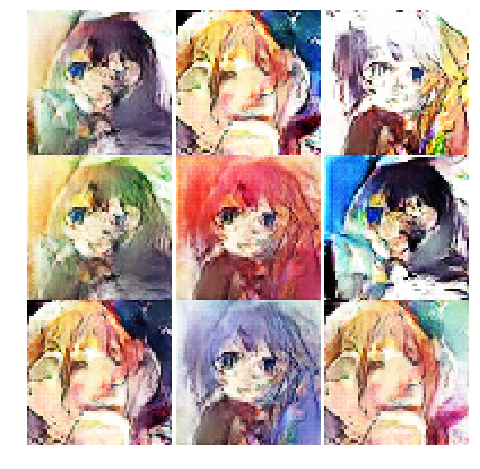

2018-04-24 23:12:11 Epoch 8/100... Discriminator Loss: 0.2029... Generator Loss: 2.4912
2018-04-24 23:14:45 Epoch 8/100... Discriminator Loss: 0.1339... Generator Loss: 6.9270
2018-04-24 23:17:23 Epoch 9/100... Discriminator Loss: 0.2952... Generator Loss: 3.7948
2018-04-24 23:19:57 Epoch 9/100... Discriminator Loss: 0.0628... Generator Loss: 4.1387
2018-04-24 23:22:31 Epoch 9/100... Discriminator Loss: 0.0937... Generator Loss: 3.7331
2018-04-24 23:25:05 Epoch 9/100... Discriminator Loss: 0.1998... Generator Loss: 2.6200
2018-04-24 23:27:40 Epoch 9/100... Discriminator Loss: 0.2274... Generator Loss: 2.5528
2018-04-24 23:30:14 Epoch 9/100... Discriminator Loss: 0.0979... Generator Loss: 3.0487
2018-04-24 23:32:49 Epoch 9/100... Discriminator Loss: 1.7799... Generator Loss: 8.6890
2018-04-24 23:35:23 Epoch 9/100... Discriminator Loss: 0.1396... Generator Loss: 3.6559


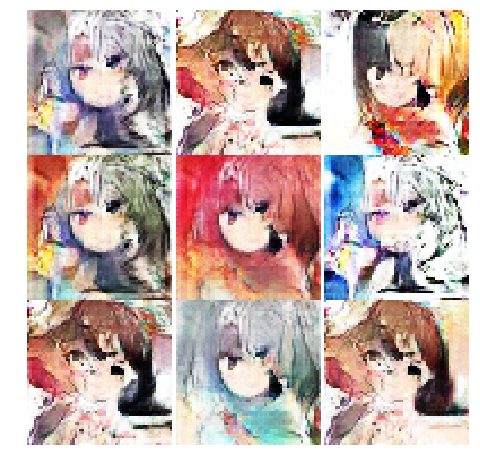

2018-04-24 23:37:57 Epoch 9/100... Discriminator Loss: 0.2270... Generator Loss: 4.1562
2018-04-24 23:40:31 Epoch 9/100... Discriminator Loss: 0.3099... Generator Loss: 2.1915
2018-04-24 23:43:05 Epoch 9/100... Discriminator Loss: 0.1943... Generator Loss: 2.6422
2018-04-24 23:45:39 Epoch 9/100... Discriminator Loss: 0.4323... Generator Loss: 5.3785
2018-04-24 23:48:12 Epoch 9/100... Discriminator Loss: 0.1271... Generator Loss: 4.4207
2018-04-24 23:50:46 Epoch 9/100... Discriminator Loss: 0.1131... Generator Loss: 3.2223
2018-04-24 23:53:19 Epoch 9/100... Discriminator Loss: 0.3103... Generator Loss: 2.0712
2018-04-24 23:55:52 Epoch 9/100... Discriminator Loss: 0.2496... Generator Loss: 4.9409
2018-04-24 23:58:26 Epoch 9/100... Discriminator Loss: 0.3910... Generator Loss: 8.4069
2018-04-25 00:01:00 Epoch 9/100... Discriminator Loss: 0.0329... Generator Loss: 5.1115


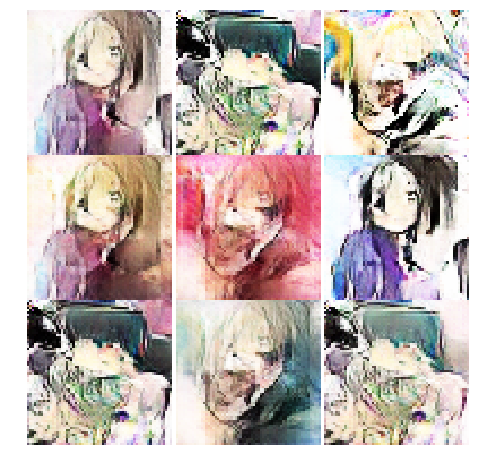

2018-04-25 00:03:34 Epoch 9/100... Discriminator Loss: 0.3810... Generator Loss: 1.6432
2018-04-25 00:06:08 Epoch 9/100... Discriminator Loss: 0.2548... Generator Loss: 3.1746
2018-04-25 00:08:42 Epoch 9/100... Discriminator Loss: 0.1829... Generator Loss: 2.4889
2018-04-25 00:11:16 Epoch 9/100... Discriminator Loss: 0.0486... Generator Loss: 4.2639
2018-04-25 00:13:50 Epoch 9/100... Discriminator Loss: 0.2243... Generator Loss: 7.5178
2018-04-25 00:16:25 Epoch 9/100... Discriminator Loss: 0.1526... Generator Loss: 3.3952
2018-04-25 00:18:59 Epoch 9/100... Discriminator Loss: 2.3370... Generator Loss: 0.1977
2018-04-25 00:21:33 Epoch 9/100... Discriminator Loss: 0.2400... Generator Loss: 5.9725
2018-04-25 00:24:07 Epoch 9/100... Discriminator Loss: 0.1525... Generator Loss: 2.6477
2018-04-25 00:26:41 Epoch 9/100... Discriminator Loss: 0.3787... Generator Loss: 1.6035


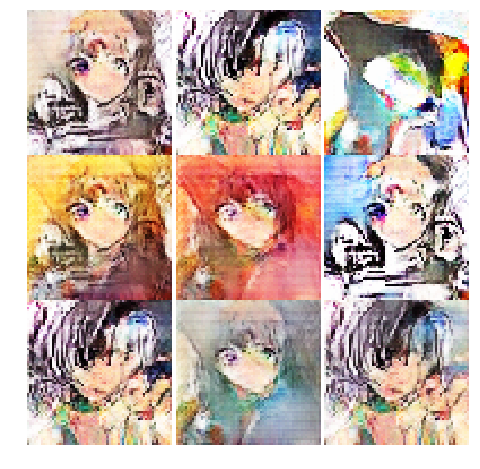

2018-04-25 00:29:16 Epoch 9/100... Discriminator Loss: 0.2429... Generator Loss: 5.1820
2018-04-25 00:31:49 Epoch 9/100... Discriminator Loss: 0.1249... Generator Loss: 3.5697
2018-04-25 00:34:23 Epoch 9/100... Discriminator Loss: 0.0816... Generator Loss: 3.4998
2018-04-25 00:36:56 Epoch 9/100... Discriminator Loss: 0.5556... Generator Loss: 1.8153
2018-04-25 00:39:34 Epoch 10/100... Discriminator Loss: 0.0812... Generator Loss: 4.0663
2018-04-25 00:42:07 Epoch 10/100... Discriminator Loss: 0.1355... Generator Loss: 3.0675
2018-04-25 00:44:41 Epoch 10/100... Discriminator Loss: 0.4116... Generator Loss: 1.7041
2018-04-25 00:47:14 Epoch 10/100... Discriminator Loss: 0.0698... Generator Loss: 4.4394
2018-04-25 00:49:48 Epoch 10/100... Discriminator Loss: 0.2930... Generator Loss: 3.2049
2018-04-25 00:52:22 Epoch 10/100... Discriminator Loss: 0.1483... Generator Loss: 3.1529


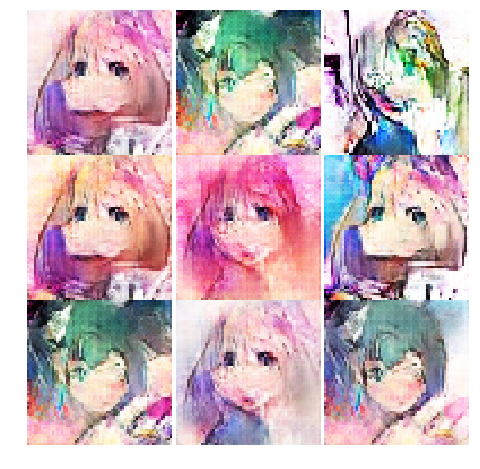

2018-04-25 00:54:56 Epoch 10/100... Discriminator Loss: 0.5028... Generator Loss: 1.6293
2018-04-25 00:57:30 Epoch 10/100... Discriminator Loss: 0.1200... Generator Loss: 3.5409
2018-04-25 01:00:04 Epoch 10/100... Discriminator Loss: 0.0202... Generator Loss: 4.4122
2018-04-25 01:02:38 Epoch 10/100... Discriminator Loss: 0.3521... Generator Loss: 1.6436
2018-04-25 01:05:13 Epoch 10/100... Discriminator Loss: 0.2081... Generator Loss: 3.8147
2018-04-25 01:07:47 Epoch 10/100... Discriminator Loss: 0.1177... Generator Loss: 3.0277
2018-04-25 01:10:21 Epoch 10/100... Discriminator Loss: 0.2171... Generator Loss: 2.3092
2018-04-25 01:12:55 Epoch 10/100... Discriminator Loss: 0.4441... Generator Loss: 1.4006
2018-04-25 01:15:29 Epoch 10/100... Discriminator Loss: 1.0394... Generator Loss: 0.7858
2018-04-25 01:18:03 Epoch 10/100... Discriminator Loss: 0.1733... Generator Loss: 5.0139


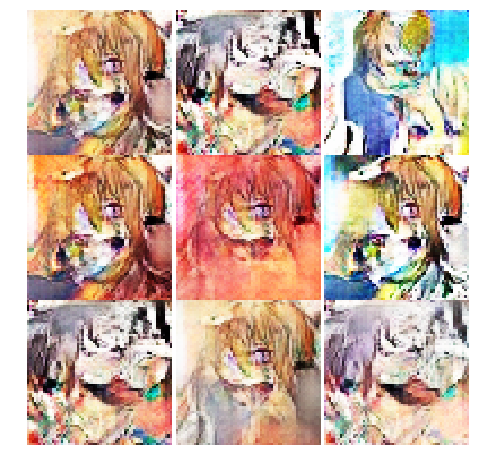

2018-04-25 01:20:37 Epoch 10/100... Discriminator Loss: 0.1315... Generator Loss: 3.1427
2018-04-25 01:23:10 Epoch 10/100... Discriminator Loss: 0.2283... Generator Loss: 5.3156
2018-04-25 01:25:43 Epoch 10/100... Discriminator Loss: 0.1957... Generator Loss: 2.8454
2018-04-25 01:28:16 Epoch 10/100... Discriminator Loss: 0.0197... Generator Loss: 4.6487
2018-04-25 01:30:50 Epoch 10/100... Discriminator Loss: 0.1033... Generator Loss: 4.5928
2018-04-25 01:33:23 Epoch 10/100... Discriminator Loss: 0.3194... Generator Loss: 1.9095
2018-04-25 01:35:57 Epoch 10/100... Discriminator Loss: 0.2367... Generator Loss: 2.3566
2018-04-25 01:38:30 Epoch 10/100... Discriminator Loss: 0.1311... Generator Loss: 2.9264
2018-04-25 01:41:04 Epoch 10/100... Discriminator Loss: 0.1696... Generator Loss: 2.6316
2018-04-25 01:43:38 Epoch 10/100... Discriminator Loss: 0.3081... Generator Loss: 2.1727


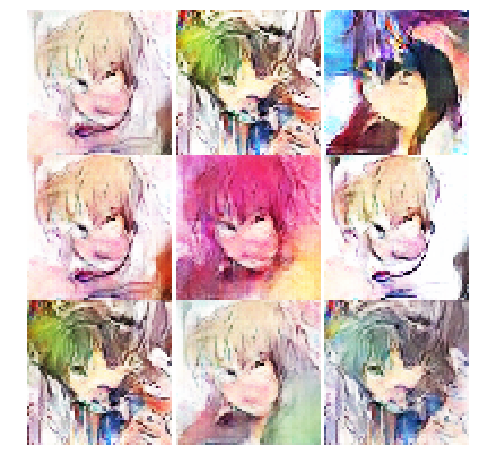

2018-04-25 01:46:12 Epoch 10/100... Discriminator Loss: 0.3715... Generator Loss: 10.6713
2018-04-25 01:48:46 Epoch 10/100... Discriminator Loss: 0.2041... Generator Loss: 2.8985
2018-04-25 01:51:20 Epoch 10/100... Discriminator Loss: 0.7200... Generator Loss: 1.0555
2018-04-25 01:53:55 Epoch 10/100... Discriminator Loss: 0.0979... Generator Loss: 7.8917
2018-04-25 01:56:29 Epoch 10/100... Discriminator Loss: 0.1721... Generator Loss: 2.6310
2018-04-25 01:59:03 Epoch 10/100... Discriminator Loss: 0.1710... Generator Loss: 2.7296
2018-04-25 02:01:41 Epoch 11/100... Discriminator Loss: 0.0723... Generator Loss: 3.1501
2018-04-25 02:04:15 Epoch 11/100... Discriminator Loss: 0.0687... Generator Loss: 3.7159
2018-04-25 02:06:48 Epoch 11/100... Discriminator Loss: 0.3267... Generator Loss: 2.1249
2018-04-25 02:09:22 Epoch 11/100... Discriminator Loss: 0.1125... Generator Loss: 6.2202


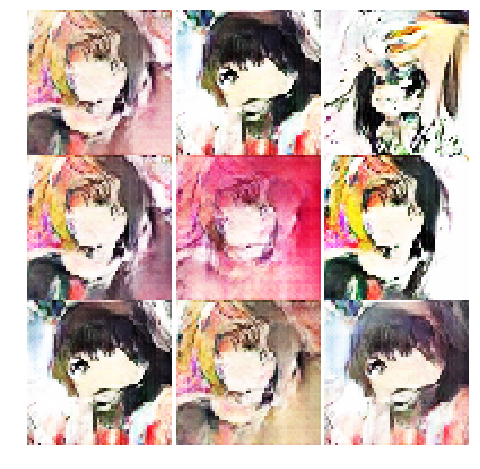

2018-04-25 02:11:55 Epoch 11/100... Discriminator Loss: 0.0893... Generator Loss: 3.7073
2018-04-25 02:14:29 Epoch 11/100... Discriminator Loss: 0.1277... Generator Loss: 3.5370
2018-04-25 02:17:02 Epoch 11/100... Discriminator Loss: 0.2389... Generator Loss: 2.9004
2018-04-25 02:19:36 Epoch 11/100... Discriminator Loss: 0.1376... Generator Loss: 3.1636
2018-04-25 02:22:09 Epoch 11/100... Discriminator Loss: 0.2524... Generator Loss: 2.5911
2018-04-25 02:24:42 Epoch 11/100... Discriminator Loss: 0.0787... Generator Loss: 4.4566
2018-04-25 02:27:16 Epoch 11/100... Discriminator Loss: 0.1421... Generator Loss: 4.9390
2018-04-25 02:29:49 Epoch 11/100... Discriminator Loss: 0.2085... Generator Loss: 4.6390
2018-04-25 02:32:23 Epoch 11/100... Discriminator Loss: 0.0204... Generator Loss: 5.1419
2018-04-25 02:34:57 Epoch 11/100... Discriminator Loss: 0.1280... Generator Loss: 2.8997


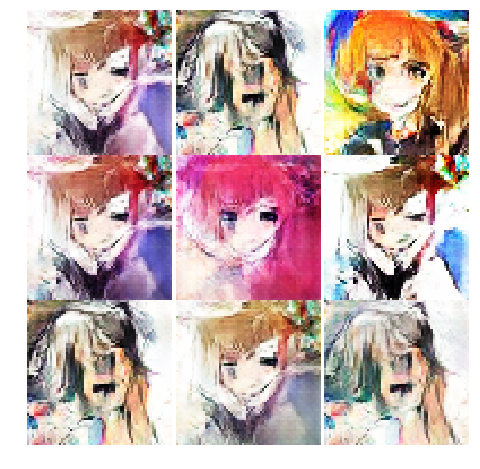

2018-04-25 02:37:32 Epoch 11/100... Discriminator Loss: 0.3599... Generator Loss: 2.3065
2018-04-25 02:40:06 Epoch 11/100... Discriminator Loss: 0.0723... Generator Loss: 5.2644
2018-04-25 02:42:40 Epoch 11/100... Discriminator Loss: 0.0399... Generator Loss: 3.8939
2018-04-25 02:45:15 Epoch 11/100... Discriminator Loss: 0.2256... Generator Loss: 2.2916
2018-04-25 02:47:49 Epoch 11/100... Discriminator Loss: 0.0761... Generator Loss: 4.1260
2018-04-25 02:50:22 Epoch 11/100... Discriminator Loss: 0.0993... Generator Loss: 3.7503
2018-04-25 02:52:56 Epoch 11/100... Discriminator Loss: 0.1555... Generator Loss: 4.4471
2018-04-25 02:55:29 Epoch 11/100... Discriminator Loss: 0.6614... Generator Loss: 1.7368
2018-04-25 02:58:03 Epoch 11/100... Discriminator Loss: 0.2865... Generator Loss: 9.5114
2018-04-25 03:00:36 Epoch 11/100... Discriminator Loss: 0.3506... Generator Loss: 1.6372


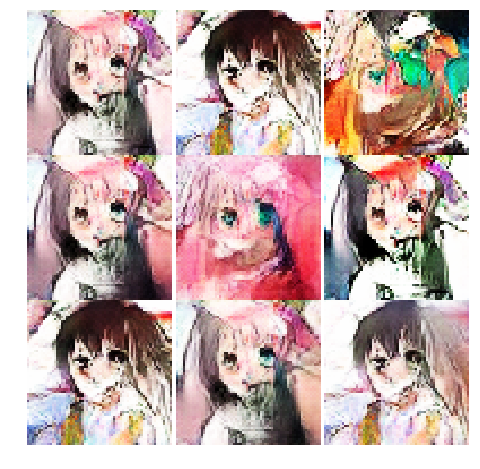

2018-04-25 03:03:10 Epoch 11/100... Discriminator Loss: 0.1450... Generator Loss: 2.7832
2018-04-25 03:05:43 Epoch 11/100... Discriminator Loss: 0.0622... Generator Loss: 3.8182
2018-04-25 03:08:17 Epoch 11/100... Discriminator Loss: 0.8959... Generator Loss: 0.8674
2018-04-25 03:10:50 Epoch 11/100... Discriminator Loss: 0.0271... Generator Loss: 6.4141
2018-04-25 03:13:24 Epoch 11/100... Discriminator Loss: 0.0586... Generator Loss: 4.3899
2018-04-25 03:15:57 Epoch 11/100... Discriminator Loss: 0.0468... Generator Loss: 3.8101
2018-04-25 03:18:31 Epoch 11/100... Discriminator Loss: 0.1648... Generator Loss: 2.5586
2018-04-25 03:21:08 Epoch 12/100... Discriminator Loss: 0.0791... Generator Loss: 3.4015
2018-04-25 03:23:42 Epoch 12/100... Discriminator Loss: 0.4313... Generator Loss: 7.5183
2018-04-25 03:26:16 Epoch 12/100... Discriminator Loss: 0.1103... Generator Loss: 4.1879


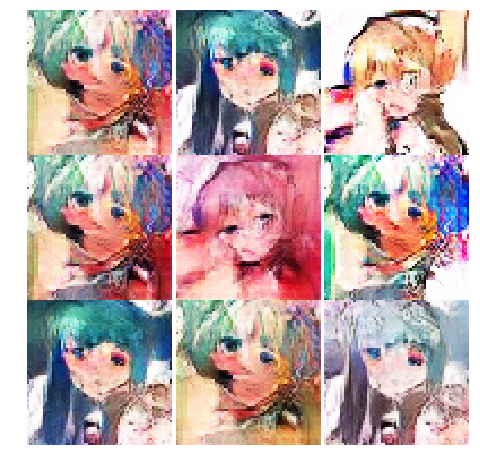

2018-04-25 03:28:51 Epoch 12/100... Discriminator Loss: 0.1664... Generator Loss: 2.5301
2018-04-25 03:31:25 Epoch 12/100... Discriminator Loss: 0.0273... Generator Loss: 4.7110
2018-04-25 03:33:59 Epoch 12/100... Discriminator Loss: 0.5202... Generator Loss: 4.2473
2018-04-25 03:36:33 Epoch 12/100... Discriminator Loss: 0.3205... Generator Loss: 1.7930
2018-04-25 03:39:07 Epoch 12/100... Discriminator Loss: 0.0450... Generator Loss: 5.8982
2018-04-25 03:41:40 Epoch 12/100... Discriminator Loss: 0.5362... Generator Loss: 1.4432
2018-04-25 03:44:14 Epoch 12/100... Discriminator Loss: 0.1675... Generator Loss: 5.4454
2018-04-25 03:46:48 Epoch 12/100... Discriminator Loss: 0.0945... Generator Loss: 3.2095
2018-04-25 03:49:21 Epoch 12/100... Discriminator Loss: 0.2720... Generator Loss: 2.0345
2018-04-25 03:51:54 Epoch 12/100... Discriminator Loss: 0.1748... Generator Loss: 4.1394


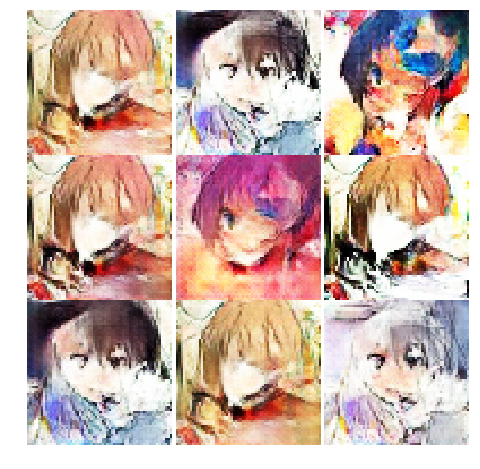

2018-04-25 03:54:28 Epoch 12/100... Discriminator Loss: 0.5150... Generator Loss: 1.4032
2018-04-25 03:57:01 Epoch 12/100... Discriminator Loss: 0.4672... Generator Loss: 6.5817
2018-04-25 03:59:35 Epoch 12/100... Discriminator Loss: 0.1652... Generator Loss: 2.5590
2018-04-25 04:02:08 Epoch 12/100... Discriminator Loss: 0.0963... Generator Loss: 4.8782
2018-04-25 04:04:42 Epoch 12/100... Discriminator Loss: 0.0206... Generator Loss: 6.3584
2018-04-25 04:07:15 Epoch 12/100... Discriminator Loss: 0.7474... Generator Loss: 12.5386
2018-04-25 04:09:49 Epoch 12/100... Discriminator Loss: 0.0891... Generator Loss: 3.3634
2018-04-25 04:12:23 Epoch 12/100... Discriminator Loss: 0.0474... Generator Loss: 4.1840
2018-04-25 04:14:57 Epoch 12/100... Discriminator Loss: 0.1174... Generator Loss: 5.0139
2018-04-25 04:17:32 Epoch 12/100... Discriminator Loss: 0.2893... Generator Loss: 2.1958


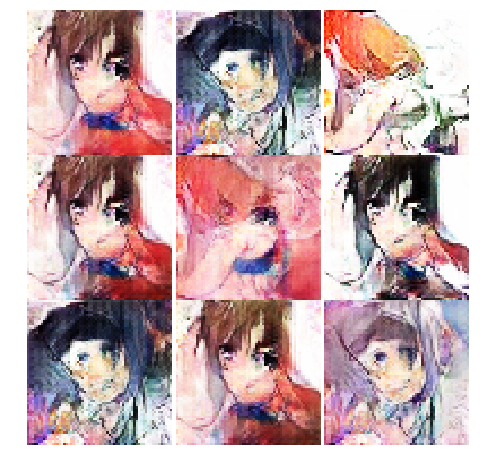

2018-04-25 04:20:07 Epoch 12/100... Discriminator Loss: 0.0505... Generator Loss: 3.6576
2018-04-25 04:22:41 Epoch 12/100... Discriminator Loss: 0.1751... Generator Loss: 2.9117
2018-04-25 04:25:14 Epoch 12/100... Discriminator Loss: 0.0535... Generator Loss: 4.0709
2018-04-25 04:27:48 Epoch 12/100... Discriminator Loss: 0.0198... Generator Loss: 10.1575
2018-04-25 04:30:22 Epoch 12/100... Discriminator Loss: 0.0938... Generator Loss: 3.3087
2018-04-25 04:32:55 Epoch 12/100... Discriminator Loss: 0.0673... Generator Loss: 3.7388
2018-04-25 04:35:29 Epoch 12/100... Discriminator Loss: 0.1810... Generator Loss: 2.5324
2018-04-25 04:38:02 Epoch 12/100... Discriminator Loss: 0.2204... Generator Loss: 4.0647
2018-04-25 04:40:35 Epoch 12/100... Discriminator Loss: 0.0740... Generator Loss: 3.9292
2018-04-25 04:43:12 Epoch 13/100... Discriminator Loss: 0.2084... Generator Loss: 2.2095


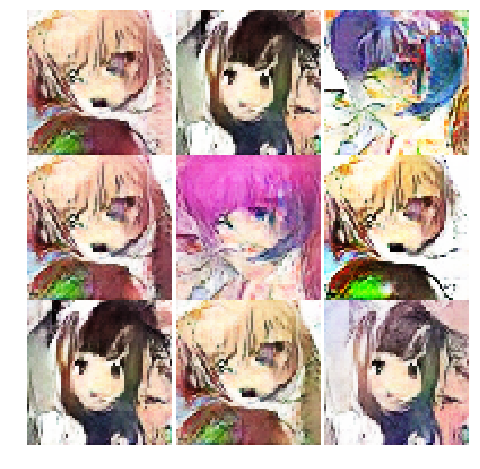

2018-04-25 04:45:46 Epoch 13/100... Discriminator Loss: 0.3563... Generator Loss: 1.6504
2018-04-25 04:48:20 Epoch 13/100... Discriminator Loss: 0.1557... Generator Loss: 2.5830
2018-04-25 04:50:54 Epoch 13/100... Discriminator Loss: 0.1927... Generator Loss: 2.5988
2018-04-25 04:53:27 Epoch 13/100... Discriminator Loss: 0.0555... Generator Loss: 4.9603
2018-04-25 04:56:01 Epoch 13/100... Discriminator Loss: 0.1313... Generator Loss: 8.3037
2018-04-25 04:58:35 Epoch 13/100... Discriminator Loss: 0.0733... Generator Loss: 3.8519
2018-04-25 05:01:09 Epoch 13/100... Discriminator Loss: 0.3618... Generator Loss: 1.5896
2018-04-25 05:03:43 Epoch 13/100... Discriminator Loss: 2.9173... Generator Loss: 0.1936
2018-04-25 05:06:18 Epoch 13/100... Discriminator Loss: 0.1343... Generator Loss: 3.4582
2018-04-25 05:08:52 Epoch 13/100... Discriminator Loss: 0.0461... Generator Loss: 4.8849


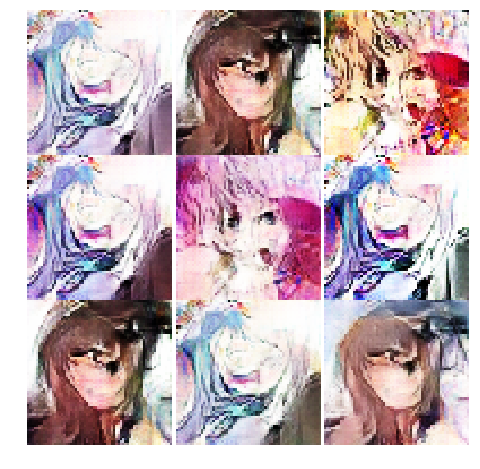

2018-04-25 05:11:26 Epoch 13/100... Discriminator Loss: 0.1516... Generator Loss: 2.7847
2018-04-25 05:14:00 Epoch 13/100... Discriminator Loss: 0.0513... Generator Loss: 3.9684
2018-04-25 05:16:34 Epoch 13/100... Discriminator Loss: 0.0773... Generator Loss: 4.3590
2018-04-25 05:19:07 Epoch 13/100... Discriminator Loss: 0.0574... Generator Loss: 4.0110
2018-04-25 05:21:41 Epoch 13/100... Discriminator Loss: 0.0976... Generator Loss: 4.0214
2018-04-25 05:24:14 Epoch 13/100... Discriminator Loss: 0.0122... Generator Loss: 6.8958
2018-04-25 05:26:48 Epoch 13/100... Discriminator Loss: 0.1238... Generator Loss: 3.2742
2018-04-25 05:29:21 Epoch 13/100... Discriminator Loss: 0.1979... Generator Loss: 2.3090
2018-04-25 05:31:54 Epoch 13/100... Discriminator Loss: 0.0834... Generator Loss: 3.4768
2018-04-25 05:34:28 Epoch 13/100... Discriminator Loss: 0.4794... Generator Loss: 7.4616


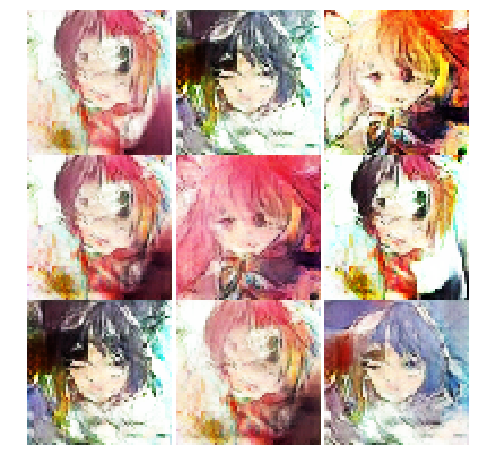

2018-04-25 05:37:02 Epoch 13/100... Discriminator Loss: 0.0634... Generator Loss: 3.5168
2018-04-25 05:39:35 Epoch 13/100... Discriminator Loss: 0.0129... Generator Loss: 5.8777
2018-04-25 05:42:09 Epoch 13/100... Discriminator Loss: 0.0577... Generator Loss: 3.5980
2018-04-25 05:44:43 Epoch 13/100... Discriminator Loss: 0.0778... Generator Loss: 3.7042
2018-04-25 05:47:17 Epoch 13/100... Discriminator Loss: 0.0600... Generator Loss: 3.4781
2018-04-25 05:49:51 Epoch 13/100... Discriminator Loss: 0.0973... Generator Loss: 3.5595
2018-04-25 05:52:25 Epoch 13/100... Discriminator Loss: 0.0139... Generator Loss: 6.1999
2018-04-25 05:54:59 Epoch 13/100... Discriminator Loss: 0.3635... Generator Loss: 1.6088
2018-04-25 05:57:33 Epoch 13/100... Discriminator Loss: 0.1251... Generator Loss: 3.6170
2018-04-25 06:00:07 Epoch 13/100... Discriminator Loss: 0.0552... Generator Loss: 3.9706


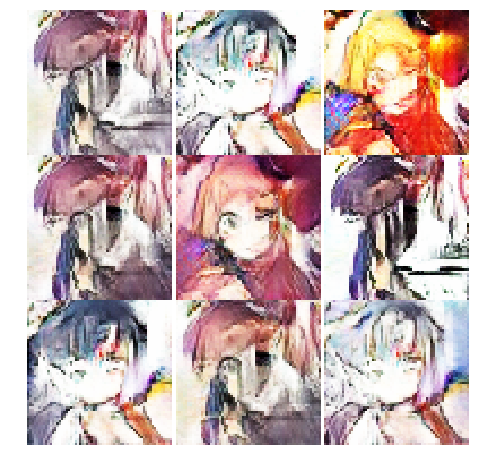

2018-04-25 06:02:45 Epoch 14/100... Discriminator Loss: 0.0652... Generator Loss: 3.6453
2018-04-25 06:05:18 Epoch 14/100... Discriminator Loss: 3.7851... Generator Loss: 0.0676
2018-04-25 06:07:52 Epoch 14/100... Discriminator Loss: 0.2335... Generator Loss: 2.2835
2018-04-25 06:10:25 Epoch 14/100... Discriminator Loss: 0.5957... Generator Loss: 4.5512
2018-04-25 06:12:59 Epoch 14/100... Discriminator Loss: 0.0820... Generator Loss: 5.2890
2018-04-25 06:15:32 Epoch 14/100... Discriminator Loss: 0.1500... Generator Loss: 3.7349
2018-04-25 06:18:05 Epoch 14/100... Discriminator Loss: 0.0190... Generator Loss: 5.5075
2018-04-25 06:20:38 Epoch 14/100... Discriminator Loss: 0.0522... Generator Loss: 4.4574
2018-04-25 06:23:12 Epoch 14/100... Discriminator Loss: 0.0221... Generator Loss: 5.0010
2018-04-25 06:25:45 Epoch 14/100... Discriminator Loss: 0.0452... Generator Loss: 5.7358


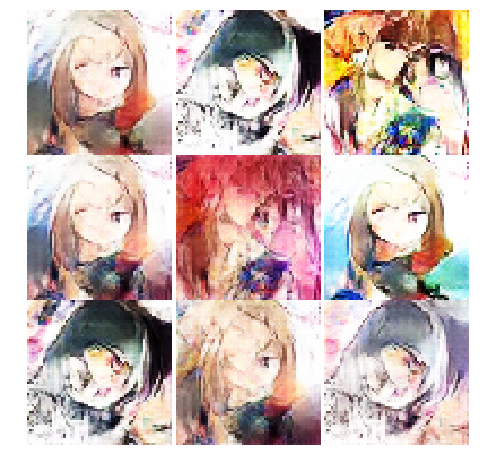

2018-04-25 06:28:19 Epoch 14/100... Discriminator Loss: 0.0887... Generator Loss: 3.7348
2018-04-25 06:30:53 Epoch 14/100... Discriminator Loss: 0.8960... Generator Loss: 1.0226
2018-04-25 06:33:27 Epoch 14/100... Discriminator Loss: 0.2027... Generator Loss: 3.4484
2018-04-25 06:36:01 Epoch 14/100... Discriminator Loss: 0.1449... Generator Loss: 2.9828
2018-04-25 06:38:35 Epoch 14/100... Discriminator Loss: 0.2802... Generator Loss: 2.3894
2018-04-25 06:41:09 Epoch 14/100... Discriminator Loss: 0.2221... Generator Loss: 2.2186
2018-04-25 06:43:44 Epoch 14/100... Discriminator Loss: 0.0941... Generator Loss: 6.7407
2018-04-25 06:46:18 Epoch 14/100... Discriminator Loss: 0.0303... Generator Loss: 4.7701
2018-04-25 06:48:52 Epoch 14/100... Discriminator Loss: 0.0686... Generator Loss: 3.6297
2018-04-25 06:51:26 Epoch 14/100... Discriminator Loss: 0.0907... Generator Loss: 3.1434


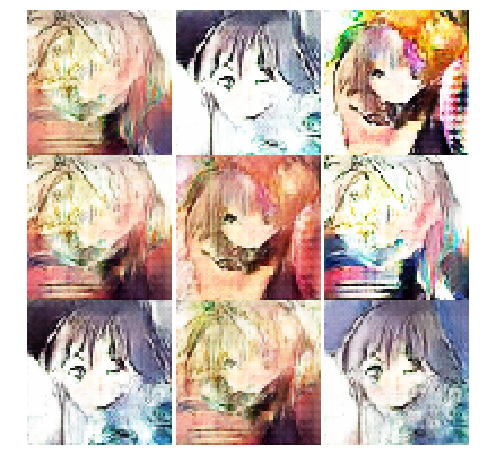

2018-04-25 06:54:00 Epoch 14/100... Discriminator Loss: 0.0805... Generator Loss: 3.2405
2018-04-25 06:56:33 Epoch 14/100... Discriminator Loss: 0.0614... Generator Loss: 4.2545
2018-04-25 06:59:07 Epoch 14/100... Discriminator Loss: 0.0250... Generator Loss: 4.3058
2018-04-25 07:01:40 Epoch 14/100... Discriminator Loss: 0.0511... Generator Loss: 5.6692
2018-04-25 07:04:14 Epoch 14/100... Discriminator Loss: 0.0127... Generator Loss: 5.0384
2018-04-25 07:06:47 Epoch 14/100... Discriminator Loss: 0.2828... Generator Loss: 1.8660
2018-04-25 07:09:20 Epoch 14/100... Discriminator Loss: 0.1155... Generator Loss: 3.1437
2018-04-25 07:11:53 Epoch 14/100... Discriminator Loss: 0.0421... Generator Loss: 12.2354
2018-04-25 07:14:27 Epoch 14/100... Discriminator Loss: 0.8604... Generator Loss: 9.0266
2018-04-25 07:17:01 Epoch 14/100... Discriminator Loss: 0.1442... Generator Loss: 2.7412


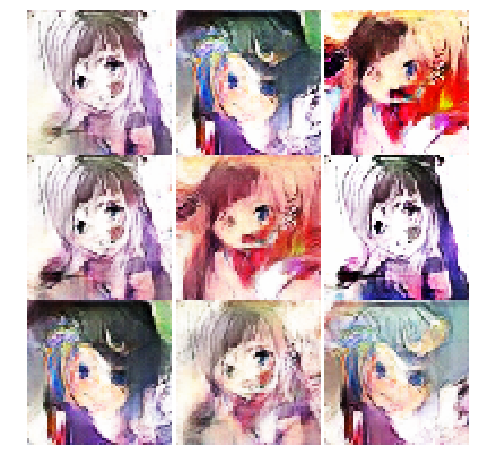

2018-04-25 07:19:35 Epoch 14/100... Discriminator Loss: 0.0621... Generator Loss: 4.7765
2018-04-25 07:22:09 Epoch 14/100... Discriminator Loss: 0.0653... Generator Loss: 4.0632
2018-04-25 07:24:46 Epoch 15/100... Discriminator Loss: 0.0705... Generator Loss: 4.0245
2018-04-25 07:27:20 Epoch 15/100... Discriminator Loss: 0.0738... Generator Loss: 5.3554
2018-04-25 07:29:54 Epoch 15/100... Discriminator Loss: 0.1665... Generator Loss: 2.6228
2018-04-25 07:32:29 Epoch 15/100... Discriminator Loss: 0.1116... Generator Loss: 3.7921
2018-04-25 07:35:03 Epoch 15/100... Discriminator Loss: 0.0926... Generator Loss: 3.5159
2018-04-25 07:37:37 Epoch 15/100... Discriminator Loss: 0.0467... Generator Loss: 4.6411
2018-04-25 07:40:10 Epoch 15/100... Discriminator Loss: 0.0646... Generator Loss: 3.4838
2018-04-25 07:42:44 Epoch 15/100... Discriminator Loss: 0.0551... Generator Loss: 4.8903


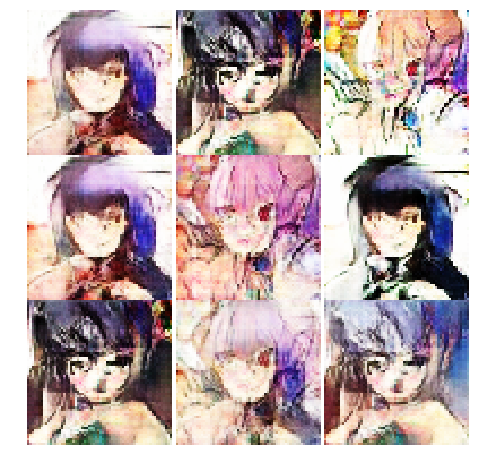

2018-04-25 07:45:17 Epoch 15/100... Discriminator Loss: 0.0239... Generator Loss: 4.8137
2018-04-25 07:47:51 Epoch 15/100... Discriminator Loss: 0.2798... Generator Loss: 2.0019
2018-04-25 07:50:24 Epoch 15/100... Discriminator Loss: 0.0502... Generator Loss: 4.6388
2018-04-25 07:52:57 Epoch 15/100... Discriminator Loss: 0.0926... Generator Loss: 7.1345
2018-04-25 07:55:30 Epoch 15/100... Discriminator Loss: 0.3882... Generator Loss: 2.9148
2018-04-25 07:58:03 Epoch 15/100... Discriminator Loss: 0.0561... Generator Loss: 4.8712
2018-04-25 08:00:37 Epoch 15/100... Discriminator Loss: 0.0621... Generator Loss: 4.2701
2018-04-25 08:03:11 Epoch 15/100... Discriminator Loss: 0.0429... Generator Loss: 4.9772
2018-04-25 08:05:45 Epoch 15/100... Discriminator Loss: 0.0605... Generator Loss: 3.4191
2018-04-25 08:08:19 Epoch 15/100... Discriminator Loss: 0.3223... Generator Loss: 2.8866


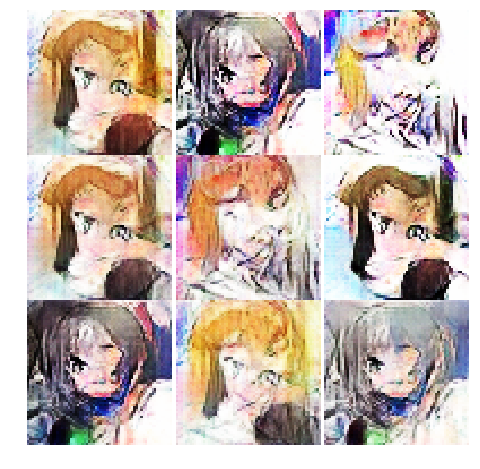

2018-04-25 08:10:53 Epoch 15/100... Discriminator Loss: 0.5063... Generator Loss: 1.4613
2018-04-25 08:13:27 Epoch 15/100... Discriminator Loss: 0.0856... Generator Loss: 3.4126
2018-04-25 08:16:01 Epoch 15/100... Discriminator Loss: 2.5258... Generator Loss: 9.9907
2018-04-25 08:18:35 Epoch 15/100... Discriminator Loss: 0.1181... Generator Loss: 3.1363
2018-04-25 08:21:10 Epoch 15/100... Discriminator Loss: 0.1963... Generator Loss: 4.2133
2018-04-25 08:23:44 Epoch 15/100... Discriminator Loss: 0.0312... Generator Loss: 4.7621
2018-04-25 08:26:18 Epoch 15/100... Discriminator Loss: 0.1286... Generator Loss: 2.8731
2018-04-25 08:28:52 Epoch 15/100... Discriminator Loss: 0.0892... Generator Loss: 3.5816
2018-04-25 08:31:25 Epoch 15/100... Discriminator Loss: 0.0587... Generator Loss: 3.9029
2018-04-25 08:33:59 Epoch 15/100... Discriminator Loss: 0.0582... Generator Loss: 3.6752


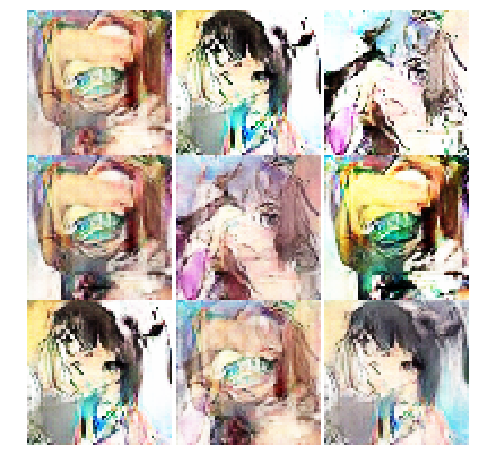

2018-04-25 08:36:33 Epoch 15/100... Discriminator Loss: 0.0338... Generator Loss: 6.6215
2018-04-25 08:39:06 Epoch 15/100... Discriminator Loss: 0.2571... Generator Loss: 6.7298
2018-04-25 08:41:40 Epoch 15/100... Discriminator Loss: 0.0801... Generator Loss: 3.8466
2018-04-25 08:44:13 Epoch 15/100... Discriminator Loss: 0.4833... Generator Loss: 1.3310
2018-04-25 08:46:51 Epoch 16/100... Discriminator Loss: 0.0657... Generator Loss: 3.6659
2018-04-25 08:49:24 Epoch 16/100... Discriminator Loss: 0.2015... Generator Loss: 2.2749
2018-04-25 08:51:58 Epoch 16/100... Discriminator Loss: 0.1799... Generator Loss: 2.6058
2018-04-25 08:54:32 Epoch 16/100... Discriminator Loss: 0.0496... Generator Loss: 3.6123
2018-04-25 08:57:05 Epoch 16/100... Discriminator Loss: 0.0566... Generator Loss: 3.5209
2018-04-25 08:59:39 Epoch 16/100... Discriminator Loss: 0.0255... Generator Loss: 4.4456


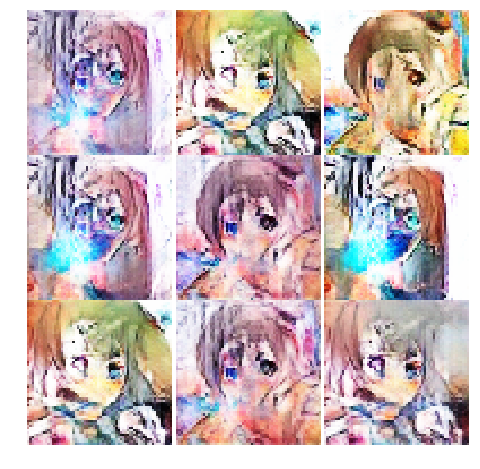

2018-04-25 09:02:14 Epoch 16/100... Discriminator Loss: 0.4122... Generator Loss: 1.5709
2018-04-25 09:04:48 Epoch 16/100... Discriminator Loss: 0.0086... Generator Loss: 6.3135
2018-04-25 09:07:22 Epoch 16/100... Discriminator Loss: 0.1838... Generator Loss: 2.5636
2018-04-25 09:09:57 Epoch 16/100... Discriminator Loss: 0.1059... Generator Loss: 3.6092
2018-04-25 09:12:31 Epoch 16/100... Discriminator Loss: 0.0831... Generator Loss: 3.7162
2018-04-25 09:15:04 Epoch 16/100... Discriminator Loss: 0.1326... Generator Loss: 5.8186
2018-04-25 09:17:38 Epoch 16/100... Discriminator Loss: 0.0819... Generator Loss: 4.1289
2018-04-25 09:20:12 Epoch 16/100... Discriminator Loss: 0.0566... Generator Loss: 5.3065
2018-04-25 09:22:45 Epoch 16/100... Discriminator Loss: 0.2729... Generator Loss: 2.3592
2018-04-25 09:25:19 Epoch 16/100... Discriminator Loss: 0.0636... Generator Loss: 3.9702


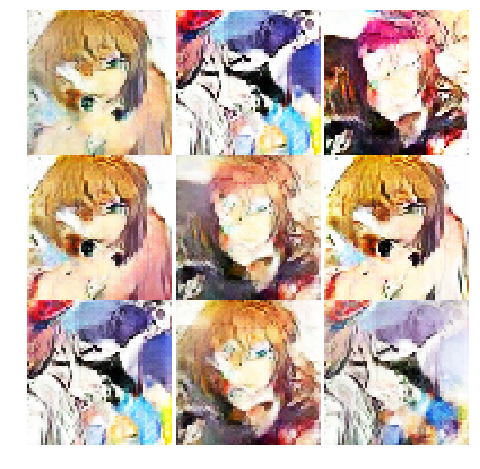

2018-04-25 09:27:53 Epoch 16/100... Discriminator Loss: 0.0439... Generator Loss: 4.4883
2018-04-25 09:30:26 Epoch 16/100... Discriminator Loss: 0.2101... Generator Loss: 2.6699
2018-04-25 09:32:59 Epoch 16/100... Discriminator Loss: 0.0890... Generator Loss: 3.9184
2018-04-25 09:35:33 Epoch 16/100... Discriminator Loss: 0.1772... Generator Loss: 2.4565
2018-04-25 09:38:06 Epoch 16/100... Discriminator Loss: 0.2104... Generator Loss: 4.3035
2018-04-25 09:40:40 Epoch 16/100... Discriminator Loss: 0.0691... Generator Loss: 4.1871
2018-04-25 09:43:14 Epoch 16/100... Discriminator Loss: 0.0143... Generator Loss: 5.5876
2018-04-25 09:45:48 Epoch 16/100... Discriminator Loss: 0.1451... Generator Loss: 2.9036
2018-04-25 09:48:22 Epoch 16/100... Discriminator Loss: 0.0143... Generator Loss: 6.7364
2018-04-25 09:50:56 Epoch 16/100... Discriminator Loss: 0.1147... Generator Loss: 7.5294


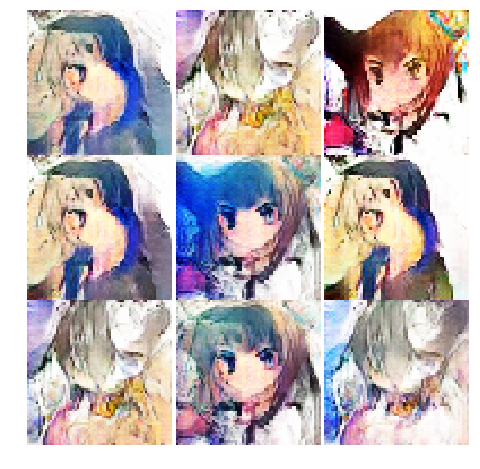

2018-04-25 09:53:31 Epoch 16/100... Discriminator Loss: 0.0880... Generator Loss: 3.2945
2018-04-25 09:56:06 Epoch 16/100... Discriminator Loss: 0.0408... Generator Loss: 5.0996
2018-04-25 09:58:40 Epoch 16/100... Discriminator Loss: 0.0493... Generator Loss: 4.0471
2018-04-25 10:01:15 Epoch 16/100... Discriminator Loss: 2.5270... Generator Loss: 0.1703
2018-04-25 10:03:48 Epoch 16/100... Discriminator Loss: 0.0664... Generator Loss: 3.7381
2018-04-25 10:06:27 Epoch 17/100... Discriminator Loss: 0.0585... Generator Loss: 3.6260
2018-04-25 10:09:01 Epoch 17/100... Discriminator Loss: 0.1531... Generator Loss: 3.0135
2018-04-25 10:11:34 Epoch 17/100... Discriminator Loss: 0.0767... Generator Loss: 3.8412
2018-04-25 10:14:08 Epoch 17/100... Discriminator Loss: 0.0403... Generator Loss: 4.4900
2018-04-25 10:16:41 Epoch 17/100... Discriminator Loss: 0.0457... Generator Loss: 4.6469


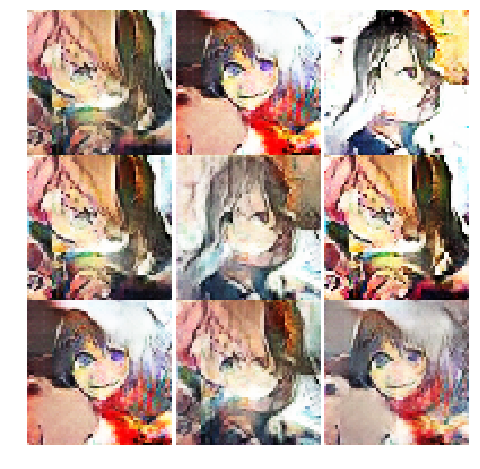

2018-04-25 10:19:15 Epoch 17/100... Discriminator Loss: 0.1340... Generator Loss: 3.7865
2018-04-25 10:21:49 Epoch 17/100... Discriminator Loss: 0.0497... Generator Loss: 3.8783
2018-04-25 10:24:22 Epoch 17/100... Discriminator Loss: 0.1148... Generator Loss: 2.8872
2018-04-25 10:26:56 Epoch 17/100... Discriminator Loss: 0.0563... Generator Loss: 4.4174
2018-04-25 10:29:30 Epoch 17/100... Discriminator Loss: 0.0510... Generator Loss: 5.4103
2018-04-25 10:32:03 Epoch 17/100... Discriminator Loss: 0.2543... Generator Loss: 2.0211
2018-04-25 10:34:37 Epoch 17/100... Discriminator Loss: 0.0339... Generator Loss: 6.6156
2018-04-25 10:37:11 Epoch 17/100... Discriminator Loss: 0.0475... Generator Loss: 5.3049
2018-04-25 10:39:45 Epoch 17/100... Discriminator Loss: 0.1278... Generator Loss: 2.9478
2018-04-25 10:42:19 Epoch 17/100... Discriminator Loss: 0.0611... Generator Loss: 4.2889


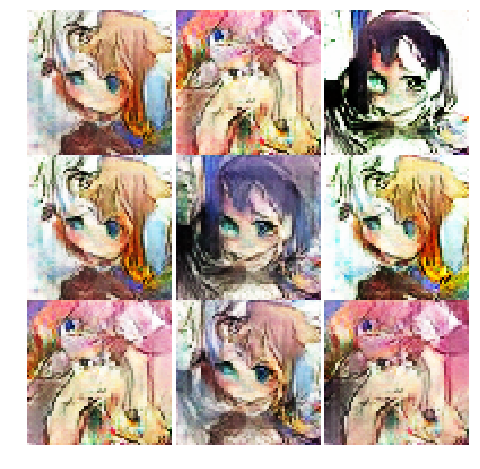

2018-04-25 10:44:54 Epoch 17/100... Discriminator Loss: 0.0423... Generator Loss: 4.4637
2018-04-25 10:47:28 Epoch 17/100... Discriminator Loss: 0.8939... Generator Loss: 0.7969
2018-04-25 10:50:02 Epoch 17/100... Discriminator Loss: 0.1070... Generator Loss: 4.9668
2018-04-25 10:52:36 Epoch 17/100... Discriminator Loss: 1.8869... Generator Loss: 12.6373
2018-04-25 10:55:09 Epoch 17/100... Discriminator Loss: 0.0391... Generator Loss: 4.7701
2018-04-25 10:57:43 Epoch 17/100... Discriminator Loss: 0.3544... Generator Loss: 1.7684
2018-04-25 11:00:16 Epoch 17/100... Discriminator Loss: 0.0630... Generator Loss: 3.3161
2018-04-25 11:02:50 Epoch 17/100... Discriminator Loss: 0.1481... Generator Loss: 3.2350
2018-04-25 11:05:23 Epoch 17/100... Discriminator Loss: 0.2302... Generator Loss: 2.1317
2018-04-25 11:07:56 Epoch 17/100... Discriminator Loss: 0.0390... Generator Loss: 4.2811


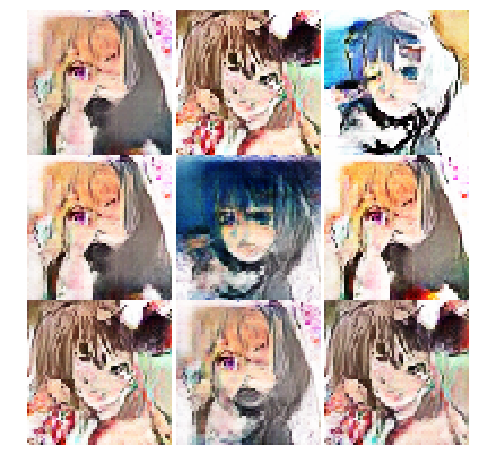

2018-04-25 11:10:30 Epoch 17/100... Discriminator Loss: 0.0088... Generator Loss: 10.1938
2018-04-25 11:13:03 Epoch 17/100... Discriminator Loss: 0.0665... Generator Loss: 4.0072
2018-04-25 11:15:37 Epoch 17/100... Discriminator Loss: 0.0696... Generator Loss: 4.1555
2018-04-25 11:18:11 Epoch 17/100... Discriminator Loss: 0.1169... Generator Loss: 3.5120
2018-04-25 11:20:44 Epoch 17/100... Discriminator Loss: 1.4687... Generator Loss: 0.4303
2018-04-25 11:23:18 Epoch 17/100... Discriminator Loss: 0.0926... Generator Loss: 3.6000
2018-04-25 11:25:52 Epoch 17/100... Discriminator Loss: 0.0328... Generator Loss: 4.4169
2018-04-25 11:28:30 Epoch 18/100... Discriminator Loss: 0.0553... Generator Loss: 3.8543
2018-04-25 11:31:05 Epoch 18/100... Discriminator Loss: 0.0582... Generator Loss: 4.7870
2018-04-25 11:33:39 Epoch 18/100... Discriminator Loss: 0.0850... Generator Loss: 3.5431


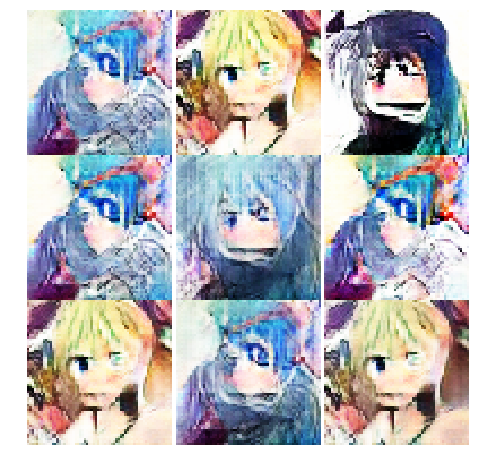

2018-04-25 11:36:13 Epoch 18/100... Discriminator Loss: 0.1418... Generator Loss: 3.8080
2018-04-25 11:38:47 Epoch 18/100... Discriminator Loss: 0.7834... Generator Loss: 0.9826
2018-04-25 11:41:21 Epoch 18/100... Discriminator Loss: 0.1702... Generator Loss: 3.2482
2018-04-25 11:43:54 Epoch 18/100... Discriminator Loss: 0.1431... Generator Loss: 2.7910
2018-04-25 11:46:27 Epoch 18/100... Discriminator Loss: 0.1939... Generator Loss: 7.5712
2018-04-25 11:49:01 Epoch 18/100... Discriminator Loss: 0.0463... Generator Loss: 4.2128
2018-04-25 11:51:34 Epoch 18/100... Discriminator Loss: 0.0698... Generator Loss: 3.4753
2018-04-25 11:54:08 Epoch 18/100... Discriminator Loss: 0.0688... Generator Loss: 3.6785
2018-04-25 11:56:41 Epoch 18/100... Discriminator Loss: 0.0254... Generator Loss: 5.0939
2018-04-25 11:59:14 Epoch 18/100... Discriminator Loss: 0.0805... Generator Loss: 8.7045


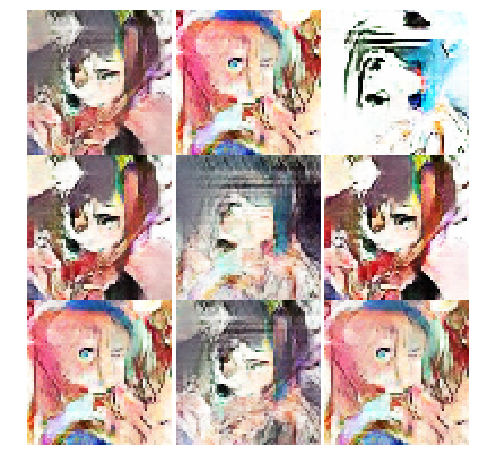

2018-04-25 12:01:48 Epoch 18/100... Discriminator Loss: 0.0348... Generator Loss: 4.5647
2018-04-25 12:04:22 Epoch 18/100... Discriminator Loss: 0.3264... Generator Loss: 1.7446
2018-04-25 12:06:55 Epoch 18/100... Discriminator Loss: 0.0607... Generator Loss: 3.6686
2018-04-25 12:09:29 Epoch 18/100... Discriminator Loss: 0.2876... Generator Loss: 1.8169
2018-04-25 12:12:03 Epoch 18/100... Discriminator Loss: 0.0776... Generator Loss: 3.4149
2018-04-25 12:14:37 Epoch 18/100... Discriminator Loss: 0.0808... Generator Loss: 3.9011
2018-04-25 12:17:11 Epoch 18/100... Discriminator Loss: 0.0879... Generator Loss: 3.5132
2018-04-25 12:19:46 Epoch 18/100... Discriminator Loss: 0.0238... Generator Loss: 7.2399
2018-04-25 12:22:20 Epoch 18/100... Discriminator Loss: 0.0361... Generator Loss: 4.3529
2018-04-25 12:24:54 Epoch 18/100... Discriminator Loss: 0.2763... Generator Loss: 13.0165


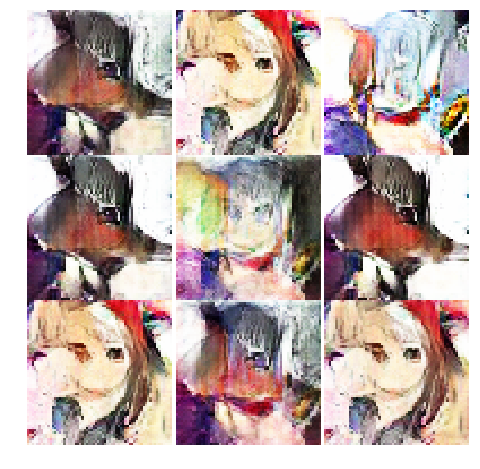

2018-04-25 12:27:29 Epoch 18/100... Discriminator Loss: 0.0194... Generator Loss: 4.9734
2018-04-25 12:30:02 Epoch 18/100... Discriminator Loss: 0.0130... Generator Loss: 5.8929
2018-04-25 12:32:36 Epoch 18/100... Discriminator Loss: 0.1460... Generator Loss: 2.9755
2018-04-25 12:35:09 Epoch 18/100... Discriminator Loss: 0.0797... Generator Loss: 3.6512
2018-04-25 12:37:43 Epoch 18/100... Discriminator Loss: 0.1624... Generator Loss: 2.4369
2018-04-25 12:40:16 Epoch 18/100... Discriminator Loss: 0.1136... Generator Loss: 3.3233
2018-04-25 12:42:49 Epoch 18/100... Discriminator Loss: 0.0527... Generator Loss: 5.1113
2018-04-25 12:45:23 Epoch 18/100... Discriminator Loss: 0.0068... Generator Loss: 7.0162
2018-04-25 12:48:01 Epoch 19/100... Discriminator Loss: 0.4251... Generator Loss: 1.8799
2018-04-25 12:50:34 Epoch 19/100... Discriminator Loss: 0.0222... Generator Loss: 5.6820


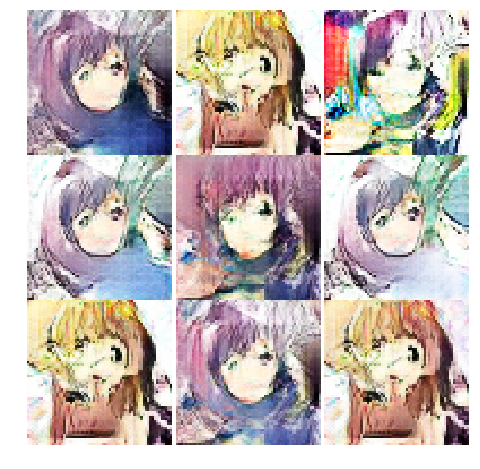

2018-04-25 12:53:08 Epoch 19/100... Discriminator Loss: 0.0330... Generator Loss: 4.0354
2018-04-25 12:55:42 Epoch 19/100... Discriminator Loss: 0.0389... Generator Loss: 4.3419
2018-04-25 12:58:16 Epoch 19/100... Discriminator Loss: 0.0519... Generator Loss: 4.2299
2018-04-25 13:00:50 Epoch 19/100... Discriminator Loss: 0.0579... Generator Loss: 3.6905
2018-04-25 13:03:24 Epoch 19/100... Discriminator Loss: 0.1210... Generator Loss: 3.0158
2018-04-25 13:05:59 Epoch 19/100... Discriminator Loss: 0.0513... Generator Loss: 4.5150
2018-04-25 13:08:33 Epoch 19/100... Discriminator Loss: 0.0623... Generator Loss: 3.6110
2018-04-25 13:11:07 Epoch 19/100... Discriminator Loss: 0.1358... Generator Loss: 2.7413
2018-04-25 13:13:41 Epoch 19/100... Discriminator Loss: 0.0112... Generator Loss: 5.6802
2018-04-25 13:16:15 Epoch 19/100... Discriminator Loss: 0.0561... Generator Loss: 6.8282


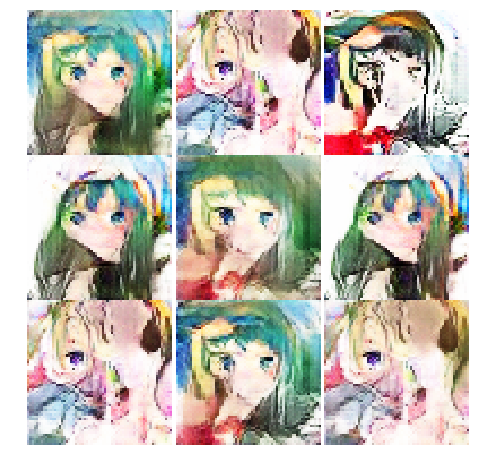

2018-04-25 13:18:49 Epoch 19/100... Discriminator Loss: 0.1290... Generator Loss: 3.6039
2018-04-25 13:21:23 Epoch 19/100... Discriminator Loss: 0.0225... Generator Loss: 5.6972
2018-04-25 13:23:56 Epoch 19/100... Discriminator Loss: 0.1205... Generator Loss: 3.1703
2018-04-25 13:26:30 Epoch 19/100... Discriminator Loss: 0.1586... Generator Loss: 5.6822
2018-04-25 13:29:03 Epoch 19/100... Discriminator Loss: 0.0935... Generator Loss: 4.2177
2018-04-25 13:31:37 Epoch 19/100... Discriminator Loss: 0.1406... Generator Loss: 2.7137
2018-04-25 13:34:10 Epoch 19/100... Discriminator Loss: 0.0640... Generator Loss: 3.4743
2018-04-25 13:36:43 Epoch 19/100... Discriminator Loss: 0.0407... Generator Loss: 3.8417
2018-04-25 13:39:17 Epoch 19/100... Discriminator Loss: 1.4293... Generator Loss: 0.4102
2018-04-25 13:41:51 Epoch 19/100... Discriminator Loss: 0.0438... Generator Loss: 3.8879


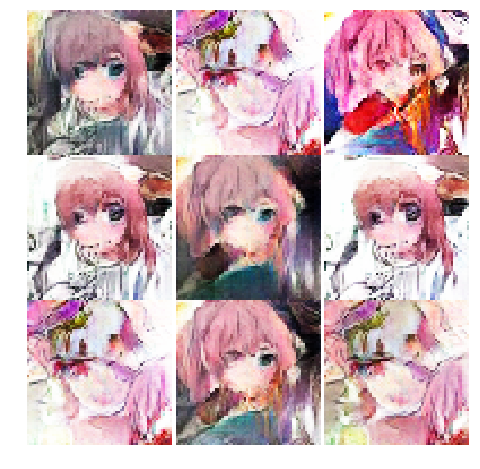

2018-04-25 13:44:25 Epoch 19/100... Discriminator Loss: 0.0248... Generator Loss: 5.8027
2018-04-25 13:46:59 Epoch 19/100... Discriminator Loss: 0.0043... Generator Loss: 7.8132
2018-04-25 13:49:33 Epoch 19/100... Discriminator Loss: 0.0837... Generator Loss: 3.1682
2018-04-25 13:52:07 Epoch 19/100... Discriminator Loss: 0.1370... Generator Loss: 3.7511
2018-04-25 13:54:41 Epoch 19/100... Discriminator Loss: 0.0283... Generator Loss: 4.2674
2018-04-25 13:57:15 Epoch 19/100... Discriminator Loss: 0.0410... Generator Loss: 5.8009
2018-04-25 13:59:49 Epoch 19/100... Discriminator Loss: 0.2117... Generator Loss: 2.4477
2018-04-25 14:02:23 Epoch 19/100... Discriminator Loss: 0.0175... Generator Loss: 5.7173
2018-04-25 14:04:57 Epoch 19/100... Discriminator Loss: 0.1102... Generator Loss: 2.8329
2018-04-25 14:07:31 Epoch 19/100... Discriminator Loss: 0.7321... Generator Loss: 1.2434


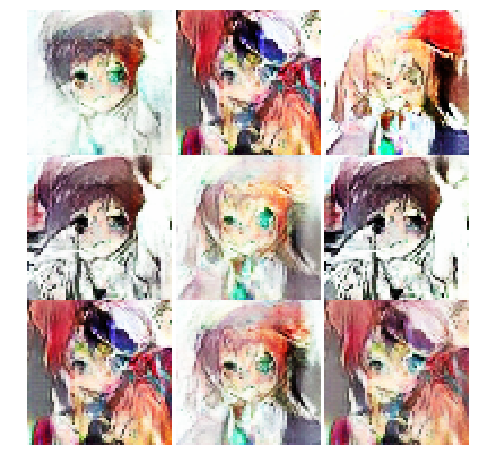

2018-04-25 14:10:09 Epoch 20/100... Discriminator Loss: 0.0205... Generator Loss: 4.9746
2018-04-25 14:12:43 Epoch 20/100... Discriminator Loss: 0.0982... Generator Loss: 3.7440
2018-04-25 14:15:17 Epoch 20/100... Discriminator Loss: 0.0350... Generator Loss: 6.8161
2018-04-25 14:17:50 Epoch 20/100... Discriminator Loss: 0.0481... Generator Loss: 3.8453
2018-04-25 14:20:23 Epoch 20/100... Discriminator Loss: 0.0819... Generator Loss: 3.2113
2018-04-25 14:22:57 Epoch 20/100... Discriminator Loss: 0.0439... Generator Loss: 4.6184
2018-04-25 14:25:30 Epoch 20/100... Discriminator Loss: 0.3234... Generator Loss: 8.4802
2018-04-25 14:28:04 Epoch 20/100... Discriminator Loss: 0.0780... Generator Loss: 3.4092
2018-04-25 14:30:38 Epoch 20/100... Discriminator Loss: 0.0303... Generator Loss: 5.6202
2018-04-25 14:33:12 Epoch 20/100... Discriminator Loss: 0.1600... Generator Loss: 2.9427


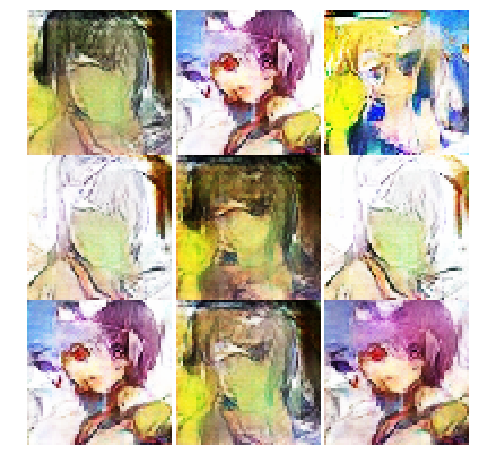

2018-04-25 14:35:46 Epoch 20/100... Discriminator Loss: 0.0835... Generator Loss: 4.4463
2018-04-25 14:38:21 Epoch 20/100... Discriminator Loss: 0.0368... Generator Loss: 3.9527
2018-04-25 14:40:55 Epoch 20/100... Discriminator Loss: 0.0474... Generator Loss: 4.2248
2018-04-25 14:43:29 Epoch 20/100... Discriminator Loss: 0.0360... Generator Loss: 4.0250
2018-04-25 14:46:04 Epoch 20/100... Discriminator Loss: 0.0478... Generator Loss: 4.4319
2018-04-25 14:48:37 Epoch 20/100... Discriminator Loss: 0.0833... Generator Loss: 3.6602
2018-04-25 14:51:11 Epoch 20/100... Discriminator Loss: 1.1597... Generator Loss: 1.2549
2018-04-25 14:53:45 Epoch 20/100... Discriminator Loss: 0.1901... Generator Loss: 2.4942
2018-04-25 14:56:19 Epoch 20/100... Discriminator Loss: 0.0455... Generator Loss: 4.3438
2018-04-25 14:58:52 Epoch 20/100... Discriminator Loss: 0.0058... Generator Loss: 6.5457


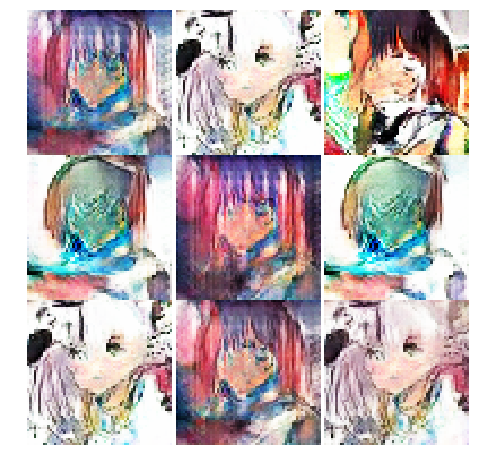

2018-04-25 15:01:26 Epoch 20/100... Discriminator Loss: 0.3596... Generator Loss: 2.3248
2018-04-25 15:04:00 Epoch 20/100... Discriminator Loss: 0.2441... Generator Loss: 2.1056
2018-04-25 15:06:33 Epoch 20/100... Discriminator Loss: 0.0962... Generator Loss: 3.4833
2018-04-25 15:09:06 Epoch 20/100... Discriminator Loss: 0.0551... Generator Loss: 6.1488
2018-04-25 15:11:40 Epoch 20/100... Discriminator Loss: 0.1291... Generator Loss: 3.4924
2018-04-25 15:14:13 Epoch 20/100... Discriminator Loss: 0.0882... Generator Loss: 3.2673
2018-04-25 15:16:47 Epoch 20/100... Discriminator Loss: 0.1159... Generator Loss: 2.9112
2018-04-25 15:19:21 Epoch 20/100... Discriminator Loss: 0.1179... Generator Loss: 2.9838
2018-04-25 15:21:55 Epoch 20/100... Discriminator Loss: 0.0653... Generator Loss: 3.8037
2018-04-25 15:24:29 Epoch 20/100... Discriminator Loss: 0.5181... Generator Loss: 1.8312


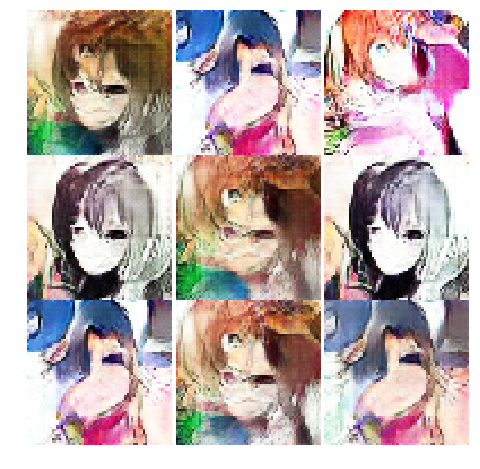

2018-04-25 15:27:04 Epoch 20/100... Discriminator Loss: 0.0070... Generator Loss: 6.2121
2018-04-25 15:29:39 Epoch 20/100... Discriminator Loss: 0.1308... Generator Loss: 2.6874
2018-04-25 15:32:17 Epoch 21/100... Discriminator Loss: 0.1296... Generator Loss: 2.8074
2018-04-25 15:34:51 Epoch 21/100... Discriminator Loss: 0.0627... Generator Loss: 3.4194
2018-04-25 15:37:25 Epoch 21/100... Discriminator Loss: 0.0338... Generator Loss: 3.9787
2018-04-25 15:39:59 Epoch 21/100... Discriminator Loss: 0.0087... Generator Loss: 10.3810
2018-04-25 15:42:33 Epoch 21/100... Discriminator Loss: 0.1387... Generator Loss: 2.7150
2018-04-25 15:45:07 Epoch 21/100... Discriminator Loss: 0.0702... Generator Loss: 4.3663
2018-04-25 15:47:41 Epoch 21/100... Discriminator Loss: 0.0184... Generator Loss: 6.8774
2018-04-25 15:50:14 Epoch 21/100... Discriminator Loss: 0.2700... Generator Loss: 2.0495


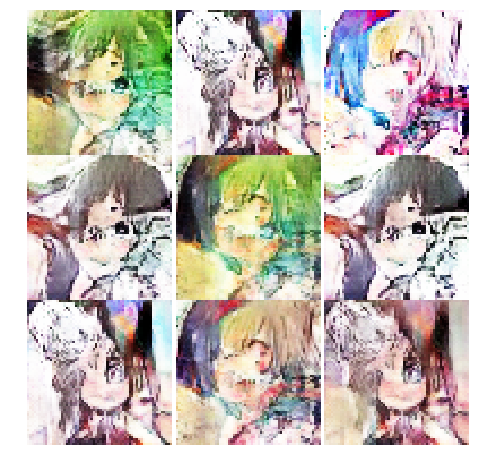

2018-04-25 15:52:48 Epoch 21/100... Discriminator Loss: 0.0894... Generator Loss: 3.3477
2018-04-25 15:55:21 Epoch 21/100... Discriminator Loss: 0.3163... Generator Loss: 1.8792
2018-04-25 15:57:55 Epoch 21/100... Discriminator Loss: 0.0402... Generator Loss: 4.0353
2018-04-25 16:00:28 Epoch 21/100... Discriminator Loss: 0.1556... Generator Loss: 3.4716
2018-04-25 16:03:03 Epoch 21/100... Discriminator Loss: 0.0248... Generator Loss: 11.5943
2018-04-25 16:05:36 Epoch 21/100... Discriminator Loss: 0.1851... Generator Loss: 13.1879
2018-04-25 16:08:11 Epoch 21/100... Discriminator Loss: 0.0463... Generator Loss: 3.9259
2018-04-25 16:10:44 Epoch 21/100... Discriminator Loss: 0.0397... Generator Loss: 7.8689
2018-04-25 16:13:18 Epoch 21/100... Discriminator Loss: 0.0421... Generator Loss: 3.9407
2018-04-25 16:15:53 Epoch 21/100... Discriminator Loss: 0.0729... Generator Loss: 3.7761


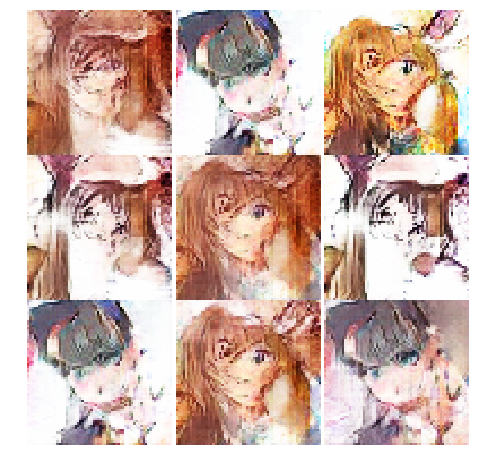

2018-04-25 16:18:28 Epoch 21/100... Discriminator Loss: 0.0815... Generator Loss: 3.2264
2018-04-25 16:21:02 Epoch 21/100... Discriminator Loss: 0.0751... Generator Loss: 3.4455
2018-04-25 16:23:36 Epoch 21/100... Discriminator Loss: 0.0687... Generator Loss: 3.3002
2018-04-25 16:26:10 Epoch 21/100... Discriminator Loss: 0.0349... Generator Loss: 5.1654
2018-04-25 16:28:43 Epoch 21/100... Discriminator Loss: 0.0602... Generator Loss: 6.2748
2018-04-25 16:31:17 Epoch 21/100... Discriminator Loss: 0.0583... Generator Loss: 3.6858
2018-04-25 16:33:51 Epoch 21/100... Discriminator Loss: 0.0745... Generator Loss: 4.1094
2018-04-25 16:36:24 Epoch 21/100... Discriminator Loss: 0.0554... Generator Loss: 3.7044
2018-04-25 16:38:58 Epoch 21/100... Discriminator Loss: 0.1729... Generator Loss: 2.3800
2018-04-25 16:41:31 Epoch 21/100... Discriminator Loss: 0.0784... Generator Loss: 3.4537


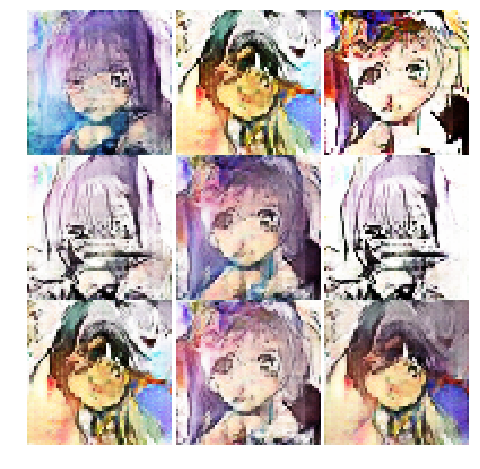

2018-04-25 16:44:04 Epoch 21/100... Discriminator Loss: 0.9274... Generator Loss: 10.8533
2018-04-25 16:46:38 Epoch 21/100... Discriminator Loss: 0.0976... Generator Loss: 3.1489
2018-04-25 16:49:11 Epoch 21/100... Discriminator Loss: 0.0502... Generator Loss: 4.2380
2018-04-25 16:51:48 Epoch 22/100... Discriminator Loss: 0.0146... Generator Loss: 7.8354
2018-04-25 16:54:22 Epoch 22/100... Discriminator Loss: 0.0441... Generator Loss: 12.2820
2018-04-25 16:56:56 Epoch 22/100... Discriminator Loss: 0.1927... Generator Loss: 2.9653
2018-04-25 16:59:30 Epoch 22/100... Discriminator Loss: 0.0116... Generator Loss: 5.1800
2018-04-25 17:02:03 Epoch 22/100... Discriminator Loss: 0.0299... Generator Loss: 4.5892
2018-04-25 17:04:38 Epoch 22/100... Discriminator Loss: 0.0206... Generator Loss: 5.1536
2018-04-25 17:07:12 Epoch 22/100... Discriminator Loss: 0.1734... Generator Loss: 2.6165


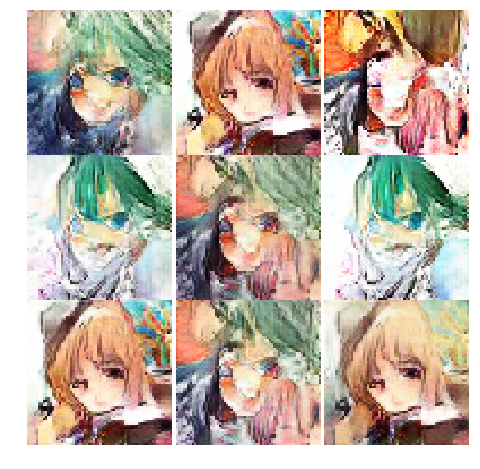

2018-04-25 17:09:47 Epoch 22/100... Discriminator Loss: 0.1685... Generator Loss: 2.6746
2018-04-25 17:12:20 Epoch 22/100... Discriminator Loss: 0.0528... Generator Loss: 7.3037
2018-04-25 17:14:54 Epoch 22/100... Discriminator Loss: 0.0498... Generator Loss: 6.6643
2018-04-25 17:17:28 Epoch 22/100... Discriminator Loss: 0.2755... Generator Loss: 1.8839
2018-04-25 17:20:01 Epoch 22/100... Discriminator Loss: 0.0711... Generator Loss: 3.6715
2018-04-25 17:22:35 Epoch 22/100... Discriminator Loss: 0.0788... Generator Loss: 3.4347
2018-04-25 17:25:08 Epoch 22/100... Discriminator Loss: 0.0411... Generator Loss: 4.7214
2018-04-25 17:27:42 Epoch 22/100... Discriminator Loss: 0.0104... Generator Loss: 7.6676
2018-04-25 17:30:15 Epoch 22/100... Discriminator Loss: 0.1882... Generator Loss: 9.3206
2018-04-25 17:32:48 Epoch 22/100... Discriminator Loss: 0.0812... Generator Loss: 3.8586


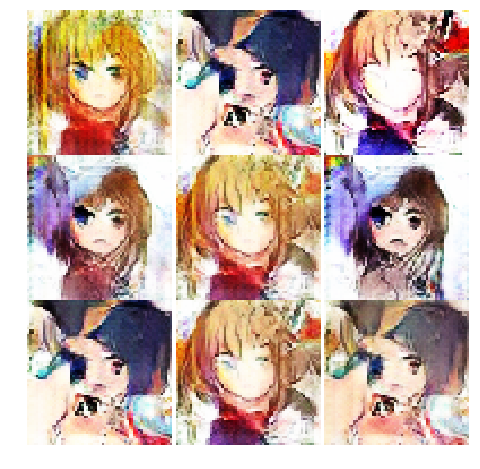

2018-04-25 17:35:22 Epoch 22/100... Discriminator Loss: 0.9886... Generator Loss: 0.7276
2018-04-25 17:37:56 Epoch 22/100... Discriminator Loss: 0.5085... Generator Loss: 2.7233
2018-04-25 17:40:30 Epoch 22/100... Discriminator Loss: 0.0231... Generator Loss: 4.3754
2018-04-25 17:43:04 Epoch 22/100... Discriminator Loss: 0.0902... Generator Loss: 3.5510
2018-04-25 17:45:38 Epoch 22/100... Discriminator Loss: 0.0458... Generator Loss: 4.4529
2018-04-25 17:48:12 Epoch 22/100... Discriminator Loss: 0.0541... Generator Loss: 3.9906
2018-04-25 17:50:46 Epoch 22/100... Discriminator Loss: 0.0310... Generator Loss: 4.4672
2018-04-25 17:53:21 Epoch 22/100... Discriminator Loss: 0.1098... Generator Loss: 3.2345
2018-04-25 17:55:56 Epoch 22/100... Discriminator Loss: 0.2201... Generator Loss: 2.1005
2018-04-25 17:58:30 Epoch 22/100... Discriminator Loss: 0.0070... Generator Loss: 5.6381


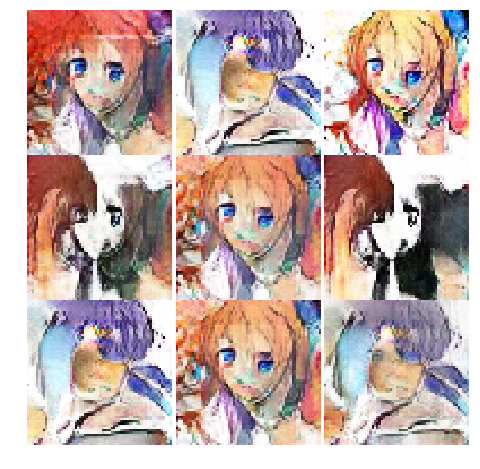

2018-04-25 18:01:04 Epoch 22/100... Discriminator Loss: 0.3536... Generator Loss: 2.1609
2018-04-25 18:03:38 Epoch 22/100... Discriminator Loss: 0.4888... Generator Loss: 7.6245
2018-04-25 18:06:12 Epoch 22/100... Discriminator Loss: 0.1011... Generator Loss: 2.7442
2018-04-25 18:08:46 Epoch 22/100... Discriminator Loss: 0.0336... Generator Loss: 11.6817
2018-04-25 18:11:20 Epoch 22/100... Discriminator Loss: 0.0665... Generator Loss: 3.7424
2018-04-25 18:13:58 Epoch 23/100... Discriminator Loss: 0.1002... Generator Loss: 3.7275
2018-04-25 18:16:32 Epoch 23/100... Discriminator Loss: 0.0168... Generator Loss: 6.6909
2018-04-25 18:19:05 Epoch 23/100... Discriminator Loss: 0.6112... Generator Loss: 1.1394
2018-04-25 18:21:39 Epoch 23/100... Discriminator Loss: 0.0427... Generator Loss: 4.1300
2018-04-25 18:24:13 Epoch 23/100... Discriminator Loss: 0.0553... Generator Loss: 3.7632


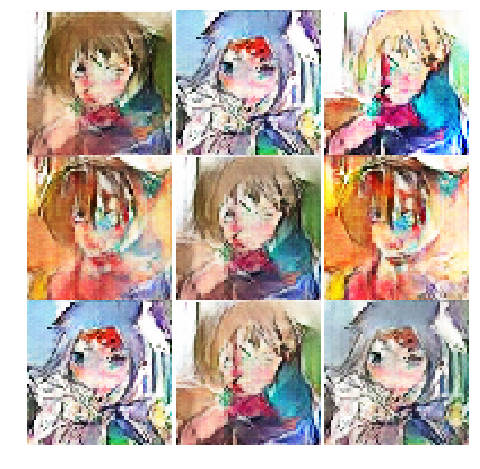

2018-04-25 18:26:47 Epoch 23/100... Discriminator Loss: 0.1004... Generator Loss: 3.6216
2018-04-25 18:29:22 Epoch 23/100... Discriminator Loss: 0.0238... Generator Loss: 4.5744
2018-04-25 18:31:56 Epoch 23/100... Discriminator Loss: 0.1183... Generator Loss: 2.6637
2018-04-25 18:34:30 Epoch 23/100... Discriminator Loss: 0.0292... Generator Loss: 4.1867
2018-04-25 18:37:04 Epoch 23/100... Discriminator Loss: 0.0329... Generator Loss: 7.1176
2018-04-25 18:39:39 Epoch 23/100... Discriminator Loss: 0.0194... Generator Loss: 4.5873
2018-04-25 18:42:14 Epoch 23/100... Discriminator Loss: 0.1292... Generator Loss: 2.8601
2018-04-25 18:44:48 Epoch 23/100... Discriminator Loss: 0.0581... Generator Loss: 4.5786
2018-04-25 18:47:22 Epoch 23/100... Discriminator Loss: 0.0480... Generator Loss: 4.2552
2018-04-25 18:49:56 Epoch 23/100... Discriminator Loss: 0.1155... Generator Loss: 3.3693


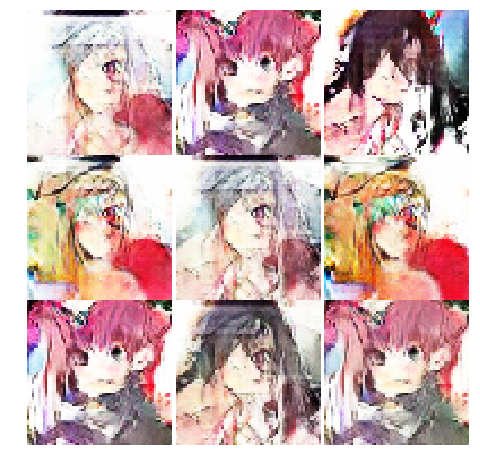

2018-04-25 18:52:30 Epoch 23/100... Discriminator Loss: 0.0857... Generator Loss: 8.2358
2018-04-25 18:55:04 Epoch 23/100... Discriminator Loss: 0.0914... Generator Loss: 5.2995
2018-04-25 18:57:37 Epoch 23/100... Discriminator Loss: 0.0606... Generator Loss: 4.2843
2018-04-25 19:00:11 Epoch 23/100... Discriminator Loss: 0.0296... Generator Loss: 6.3250
2018-04-25 19:02:45 Epoch 23/100... Discriminator Loss: 0.0455... Generator Loss: 3.7811
2018-04-25 19:05:18 Epoch 23/100... Discriminator Loss: 0.1259... Generator Loss: 2.6696
2018-04-25 19:07:52 Epoch 23/100... Discriminator Loss: 0.1018... Generator Loss: 2.8660
2018-04-25 19:10:26 Epoch 23/100... Discriminator Loss: 0.0653... Generator Loss: 3.6477
2018-04-25 19:13:00 Epoch 23/100... Discriminator Loss: 0.1343... Generator Loss: 2.5552
2018-04-25 19:15:34 Epoch 23/100... Discriminator Loss: 0.3968... Generator Loss: 1.6408


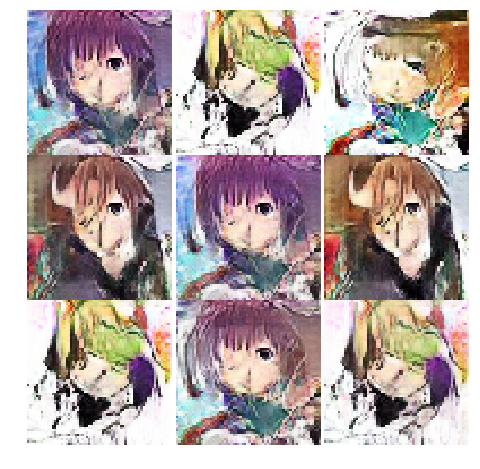

2018-04-25 19:18:09 Epoch 23/100... Discriminator Loss: 0.1394... Generator Loss: 3.4289
2018-04-25 19:20:43 Epoch 23/100... Discriminator Loss: 0.0093... Generator Loss: 6.4157
2018-04-25 19:23:17 Epoch 23/100... Discriminator Loss: 0.0277... Generator Loss: 4.2202
2018-04-25 19:25:52 Epoch 23/100... Discriminator Loss: 0.0257... Generator Loss: 5.8513
2018-04-25 19:28:26 Epoch 23/100... Discriminator Loss: 0.0192... Generator Loss: 6.4959
2018-04-25 19:31:01 Epoch 23/100... Discriminator Loss: 0.0556... Generator Loss: 3.7566
2018-04-25 19:33:35 Epoch 23/100... Discriminator Loss: 0.0863... Generator Loss: 2.8495
2018-04-25 19:36:13 Epoch 24/100... Discriminator Loss: 0.0159... Generator Loss: 7.1329
2018-04-25 19:38:47 Epoch 24/100... Discriminator Loss: 0.0577... Generator Loss: 3.3593
2018-04-25 19:41:21 Epoch 24/100... Discriminator Loss: 0.0587... Generator Loss: 13.7672


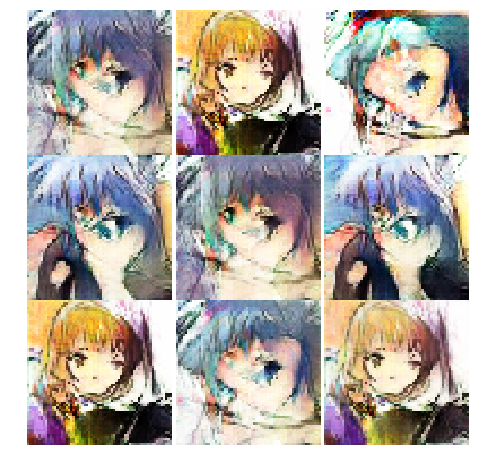

2018-04-25 19:43:55 Epoch 24/100... Discriminator Loss: 0.1258... Generator Loss: 8.7704
2018-04-25 19:46:29 Epoch 24/100... Discriminator Loss: 0.0592... Generator Loss: 3.3109
2018-04-25 19:49:02 Epoch 24/100... Discriminator Loss: 0.1293... Generator Loss: 2.8495
2018-04-25 19:51:36 Epoch 24/100... Discriminator Loss: 0.0277... Generator Loss: 4.4246
2018-04-25 19:54:10 Epoch 24/100... Discriminator Loss: 0.0589... Generator Loss: 7.1048
2018-04-25 19:56:44 Epoch 24/100... Discriminator Loss: 0.1641... Generator Loss: 9.1856
2018-04-25 19:59:18 Epoch 24/100... Discriminator Loss: 0.5596... Generator Loss: 1.3615
2018-04-25 20:01:52 Epoch 24/100... Discriminator Loss: 0.0647... Generator Loss: 3.3647
2018-04-25 20:04:26 Epoch 24/100... Discriminator Loss: 0.1189... Generator Loss: 9.2608
2018-04-25 20:07:00 Epoch 24/100... Discriminator Loss: 1.3854... Generator Loss: 0.4613


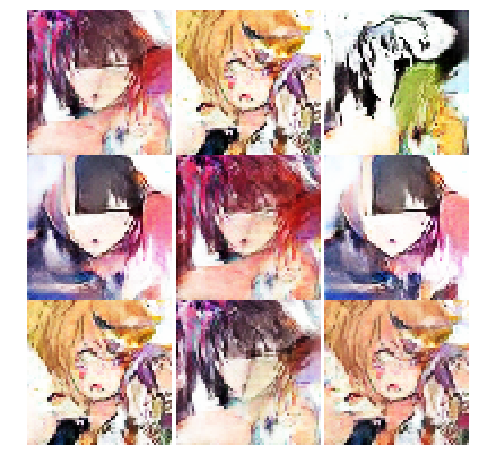

2018-04-25 20:09:36 Epoch 24/100... Discriminator Loss: 0.0498... Generator Loss: 4.0827
2018-04-25 20:12:11 Epoch 24/100... Discriminator Loss: 0.0076... Generator Loss: 5.5589
2018-04-25 20:14:46 Epoch 24/100... Discriminator Loss: 0.0909... Generator Loss: 3.2566
2018-04-25 20:17:20 Epoch 24/100... Discriminator Loss: 0.0281... Generator Loss: 4.8006
2018-04-25 20:19:53 Epoch 24/100... Discriminator Loss: 0.0106... Generator Loss: 6.2321
2018-04-25 20:22:27 Epoch 24/100... Discriminator Loss: 0.0359... Generator Loss: 4.5836
2018-04-25 20:25:01 Epoch 24/100... Discriminator Loss: 0.1680... Generator Loss: 2.6954
2018-04-25 20:27:36 Epoch 24/100... Discriminator Loss: 0.0419... Generator Loss: 3.9540
2018-04-25 20:30:10 Epoch 24/100... Discriminator Loss: 0.0197... Generator Loss: 4.9306
2018-04-25 20:32:44 Epoch 24/100... Discriminator Loss: 0.3427... Generator Loss: 1.6806


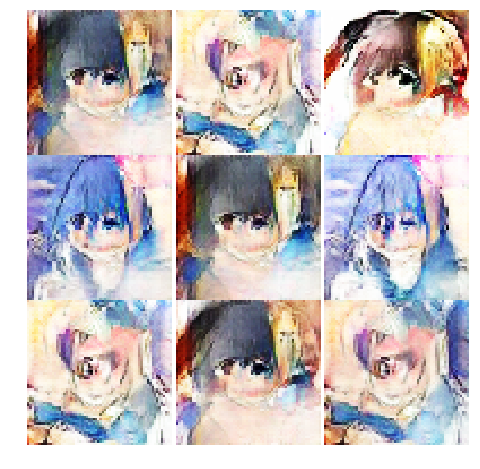

2018-04-25 20:35:18 Epoch 24/100... Discriminator Loss: 0.0404... Generator Loss: 3.9132
2018-04-25 20:37:52 Epoch 24/100... Discriminator Loss: 0.0108... Generator Loss: 5.5068
2018-04-25 20:40:25 Epoch 24/100... Discriminator Loss: 0.0482... Generator Loss: 4.8585
2018-04-25 20:42:59 Epoch 24/100... Discriminator Loss: 0.1671... Generator Loss: 2.4345
2018-04-25 20:45:34 Epoch 24/100... Discriminator Loss: 0.0567... Generator Loss: 10.1655
2018-04-25 20:48:07 Epoch 24/100... Discriminator Loss: 0.0395... Generator Loss: 4.2910
2018-04-25 20:50:41 Epoch 24/100... Discriminator Loss: 0.0368... Generator Loss: 4.8627
2018-04-25 20:53:14 Epoch 24/100... Discriminator Loss: 0.1127... Generator Loss: 2.7817
2018-04-25 20:55:51 Epoch 25/100... Discriminator Loss: 0.1295... Generator Loss: 2.9284
2018-04-25 20:58:26 Epoch 25/100... Discriminator Loss: 0.4969... Generator Loss: 2.5910


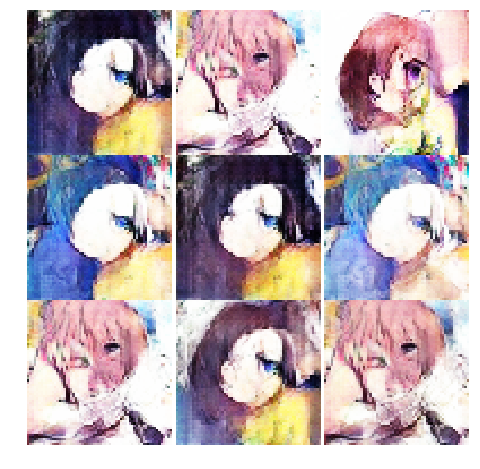

2018-04-25 21:01:01 Epoch 25/100... Discriminator Loss: 0.0420... Generator Loss: 3.7798
2018-04-25 21:03:35 Epoch 25/100... Discriminator Loss: 1.3290... Generator Loss: 0.6172
2018-04-25 21:06:09 Epoch 25/100... Discriminator Loss: 0.1808... Generator Loss: 2.4500
2018-04-25 21:08:43 Epoch 25/100... Discriminator Loss: 0.0314... Generator Loss: 8.6825
2018-04-25 21:11:18 Epoch 25/100... Discriminator Loss: 0.0117... Generator Loss: 5.1036
2018-04-25 21:13:52 Epoch 25/100... Discriminator Loss: 0.1015... Generator Loss: 3.1467


In [ ]:
data_folder_path = os.getcwd() + '/data'

dataset = Dataset(glob(os.path.join(data_folder_path, '**/*.jpg'), recursive=True), 
                  image_width=image_dim, image_height=image_dim)
                  
# Training the network
losses, samples = train(model, dataset, epochs, batch_size, print_every=100, show_every=1000, figsize=(8,8))